### 

# Modelling Healthcare Inequality in UK/Scotland: statistical Analysis and Machine Learning Algorithms

## SCOTLAND

In [1]:
# Importing necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, LabelEncoder

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 3, Finished, Available, Finished)

In [2]:
# Load the datasets specific to Scotland
simd_data = pd.read_csv("/lakehouse/default/Files/SG_SIMD_2020.csv", encoding='ISO-8859-1') 
life_expectancy_scotland = pd.read_csv("/lakehouse/default/Files/Life Expectancy Council Area - Scotland.csv") 
# Display basic information about the SIMD dataset
print("SIMD Data Overview:")
simd_data.info()

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 4, Finished, Available, Finished)

SIMD Data Overview:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6976 entries, 0 to 6975
Data columns (total 51 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   ï»¿DataZone  6976 non-null   object 
 1   DZName       6976 non-null   object 
 2   LAName       6976 non-null   object 
 3   SAPE2017     6976 non-null   int64  
 4   WAPE2017     6976 non-null   int64  
 5   Rankv2       6976 non-null   int64  
 6   Quintilev2   6976 non-null   int64  
 7   Decilev2     6976 non-null   int64  
 8   Vigintilv2   6976 non-null   int64  
 9   Percentv2    6976 non-null   int64  
 10  IncRate      6976 non-null   object 
 11  IncNumDep    6976 non-null   int64  
 12  IncRankv2    6976 non-null   float64
 13  EmpRate      6976 non-null   object 
 14  EmpNumDep    6976 non-null   int64  
 15  EmpRank      6976 non-null   float64
 16  HlthCIF      6976 non-null   int64  
 17  HlthAlcSR    6976 non-null   int64  
 18  HlthDrugSR   6976 non-null  

In [3]:
simd_data.describe()

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 5, Finished, Available, Finished)

,SAPE2017,WAPE2017,Rankv2,Quintilev2,Decilev2,Vigintilv2,Percentv2,IncNumDep,IncRankv2,EmpNumDep,...,GAccPTRet,GAccRank,CrimeCount,CrimeRate,CrimeRank,HouseNumOC,HouseNumNC,HouseRank,Shape_Leng,Shape_Area
count,6976.000000,6976.000000,6976.000000,6976.000000,6976.000000,6976.000000,6976.000000,6976.000000,6976.000000,6976.000000,...,6976.000000,6976.000000,6976.000000,6976.000000,6976.000000,6976.000000,6976.000000,6976.000000,6976.000000,6.976000e+03
mean,777.637615,500.973481,3488.500000,3.000287,5.500573,10.501147,50.506881,93.830419,3488.497420,46.558343,...,13.546277,3488.500000,22.303039,287.598767,3488.500000,82.332569,13.430619,3488.500000,11796.930969,1.117218e+07
std,219.108923,175.075939,2013.942071,1.414416,2.872487,5.766595,28.868218,76.620587,2013.937591,37.060114,...,10.709859,2013.942071,32.849022,404.842613,2013.939363,63.921332,16.800241,2013.942063,34514.362402,5.656366e+07
min,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,...,1.840000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,561.481470,9.367268e+03
25%,635.000000,395.000000,1744.750000,2.000000,3.000000,5.750000,25.750000,34.000000,1744.750000,18.000000,...,7.980000,1744.750000,7.000000,94.000000,1744.750000,35.000000,3.000000,1744.750000,2196.306838,1.336901e+05
50%,755.000000,475.000000,3488.500000,3.000000,5.500000,10.500000,50.500000,72.000000,3488.500000,36.000000,...,11.250000,3488.500000,14.000000,194.000000,3488.500000,66.500000,8.000000,3488.500000,2968.399829,2.111272e+05
75%,886.000000,568.000000,5232.250000,4.000000,8.000000,15.250000,75.250000,133.000000,5232.250000,65.000000,...,16.060000,5232.250000,28.000000,361.000000,5232.250000,112.000000,17.000000,5232.250000,4654.186576,4.141899e+05
max,3847.000000,3423.000000,6976.000000,5.000000,10.000000,20.000000,100.000000,656.000000,6969.000000,311.000000,...,190.000000,6976.000000,1159.000000,12441.000000,6928.000000,490.000000,187.000000,6974.000000,893824.142207,1.162510e+09


In [4]:
simd_data.head()

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 6, Finished, Available, Finished)

,ï»¿DataZone,DZName,LAName,SAPE2017,WAPE2017,Rankv2,Quintilev2,Decilev2,Vigintilv2,Percentv2,...,CrimeCount,CrimeRate,CrimeRank,HouseNumOC,HouseNumNC,HouseOCrat,HouseNCrat,HouseRank,Shape_Leng,Shape_Area
0,S01006506,Culter - 01,Aberdeen City,894,580,4691,4,7,14,68,...,11,125,4664.0,87,10,10%,1%,3248.0,11801.872345,4.388802e+06
1,S01006507,Culter - 02,Aberdeen City,793,470,4862,4,7,14,70,...,10,128,4602.0,85,4,10%,0%,3486.0,2900.406362,2.217468e+05
2,S01006508,Culter - 03,Aberdeen City,624,461,5686,5,9,17,82,...,8,130,4563.5,31,8,5%,1%,5342.0,3468.761949,2.701948e+05
3,S01006509,Culter - 04,Aberdeen City,537,307,4332,4,7,13,63,...,4,75,5626.0,42,6,7%,1%,4394.5,1647.461389,9.625426e+04
4,S01006510,Culter - 05,Aberdeen City,663,415,3913,3,6,12,57,...,11,168,3885.0,50,7,9%,1%,3736.0,3026.111412,1.800766e+05


In [5]:
# Display basic information about the Life Expectancy dataset for Scotland
print("\nLife Expectancy in Scotland Data Overview:")
life_expectancy_scotland.info()

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 7, Finished, Available, Finished)


Life Expectancy in Scotland Data Overview:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1320 entries, 0 to 1319
Data columns (total 7 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Area Name                  1320 non-null   object 
 1   Sex                        1320 non-null   object 
 2   Age group                  1320 non-null   object 
 3   Life expectancy (years)    1320 non-null   float64
 4   Lower confidence interval  1320 non-null   float64
 5   upper CI                   1320 non-null   float64
 6   Countries                  1320 non-null   object 
dtypes: float64(3), object(4)
memory usage: 72.3+ KB


In [6]:
life_expectancy_scotland.describe()

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 8, Finished, Available, Finished)

,Life expectancy (years),Lower confidence interval,upper CI
count,1320.000000,1320.000000,1320.000000
mean,39.733333,39.258500,40.207848
std,24.797700,24.706972,24.890251
min,3.230000,2.750000,3.570000
25%,16.570000,16.295000,16.975000
50%,38.170000,37.615000,38.585000
75%,62.037500,61.420000,62.632500
max,84.000000,83.380000,84.890000


In [7]:
life_expectancy_scotland.head()

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 9, Finished, Available, Finished)

,Area Name,Sex,Age group,Life expectancy (years),Lower confidence interval,upper CI,Countries
0,Scotland,Male,<1,76.54,76.44,76.63,Scotland
1,Scotland,Male,01 to 04,75.80,75.71,75.89,Scotland
2,Scotland,Male,05 to 09,71.85,71.76,71.93,Scotland
3,Scotland,Male,10 to 14,66.87,66.78,66.96,Scotland
4,Scotland,Male,15 to 19,61.91,61.82,61.99,Scotland


In [8]:
# Clean column names to remove unwanted characters
life_expectancy_scotland.columns = life_expectancy_scotland.columns.str.strip().str.replace('ï»¿', '')

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 10, Finished, Available, Finished)

In [9]:
# Clean column names to remove unwanted characters
simd_data.columns = simd_data.columns.str.strip().str.replace('ï»¿', '')

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 11, Finished, Available, Finished)

In [10]:
life_expectancy_scotland.info()

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 12, Finished, Available, Finished)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1320 entries, 0 to 1319
Data columns (total 7 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Area Name                  1320 non-null   object 
 1   Sex                        1320 non-null   object 
 2   Age group                  1320 non-null   object 
 3   Life expectancy (years)    1320 non-null   float64
 4   Lower confidence interval  1320 non-null   float64
 5   upper CI                   1320 non-null   float64
 6   Countries                  1320 non-null   object 
dtypes: float64(3), object(4)
memory usage: 72.3+ KB


In [11]:
# Rename columns in df1 
life_expectancy_scotland.rename(columns={
    'Life expectancy (years)': 'Life expectancy',  # Standardize the column name
    'Lower confidence interval': 'Lower CI',  # Standardize naming
    'upper CI': 'Upper CI',  # Standardize naming
    'Countries': 'Country',
}, inplace=True)

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 13, Finished, Available, Finished)

In [12]:
life_expectancy_scotland.head()

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 14, Finished, Available, Finished)

,Area Name,Sex,Age group,Life expectancy,Lower CI,Upper CI,Country
0,Scotland,Male,<1,76.54,76.44,76.63,Scotland
1,Scotland,Male,01 to 04,75.80,75.71,75.89,Scotland
2,Scotland,Male,05 to 09,71.85,71.76,71.93,Scotland
3,Scotland,Male,10 to 14,66.87,66.78,66.96,Scotland
4,Scotland,Male,15 to 19,61.91,61.82,61.99,Scotland


In [13]:
#Drop the Area name Scotland
life_expectancy_scotland = life_expectancy_scotland[life_expectancy_scotland['Area Name'] != 'Scotland']
life_expectancy_scotland.head()

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 15, Finished, Available, Finished)

,Area Name,Sex,Age group,Life expectancy,Lower CI,Upper CI,Country
20,Edinburgh,Male,<1,77.78,77.48,78.09,Scotland
21,Edinburgh,Male,01 to 04,77.04,76.74,77.33,Scotland
22,Edinburgh,Male,05 to 09,73.10,72.81,73.39,Scotland
23,Edinburgh,Male,10 to 14,68.12,67.83,68.40,Scotland
24,Edinburgh,Male,15 to 19,63.14,62.86,63.43,Scotland


In [14]:
#Check the unique values in Scotland for completeness
unique_values = sorted(life_expectancy_scotland['Area Name'].unique())
print(unique_values)

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 16, Finished, Available, Finished)

['Aberdeen City', 'Aberdeenshire', 'Angus', 'Argyll and Bute', 'Clackmannanshire', 'Dumfries and Galloway', 'Dundee City', 'East Ayrshire', 'East Dunbartonshire', 'East Lothian', 'East Renfrewshire', 'Edinburgh', 'Falkirk', 'Fife', 'Glasgow City', 'Highland', 'Inverclyde', 'Midlothian', 'Moray', 'Na h-Eileanan Siar', 'North Ayrshire', 'North Lanarkshire', 'Orkney Islands', 'Perth and Kinross', 'Renfrewshire', 'Scottish Borders', 'Shetland Islands', 'South Ayrshire', 'South Lanarkshire', 'Stirling', 'West Dunbartonshire', 'West Lothian']


In [15]:
# Replace 'column_name' with the actual name of the column for which you want the unique count
unique_count = life_expectancy_scotland['Area Name'].nunique()
print(f'There are {unique_count} unique values in the column.')

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 17, Finished, Available, Finished)

There are 32 unique values in the column.


In [16]:
# Replace 'column_name' with the actual name of the column for which you want the unique count
unique_count = life_expectancy_scotland['Sex'].nunique()
print(f'There are {unique_count} unique values in the column.')

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 18, Finished, Available, Finished)

There are 2 unique values in the column.


In [17]:
# Replace values using .loc to avoid SettingWithCopyWarning
life_expectancy_scotland.loc[life_expectancy_scotland['Area Name'] == 'Edinburgh', 'Area Name'] = 'City of Edinburgh'

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 19, Finished, Available, Finished)

In this project, we focus on modeling healthcare inequality in Scotland using relevant fields from the SIMD dataset. We retain indicators like IncRate, EmpRate (income and employment), HlthRank (health), EduRank (education), GAccRank (geographic access), CrimeRate (crime), and HouseRank (housing), as these are critical determinants of health disparities. Fields such as Shape_Leng, Shape_Area (spatial metrics), Vigintilv2, Percentv2 (rankings) are dropped to streamline the analysis. This selection reduces noise in the dataset, allowing us to concentrate on variables that directly impact health outcomes. Our approach aims to identify the most disadvantaged groups and provide actionable recommendations for reducing healthcare inequality in Scotland.

In [18]:
# Check for missing values in both datasets
missing_values_life_expectancy_scotland = life_expectancy_scotland.isnull().sum()
missing_values_simd_data = simd_data.isnull().sum()

print("Missing values in Life Expectancy Scotland Data:")
print(missing_values_life_expectancy_scotland[missing_values_life_expectancy_scotland > 0])

print("\nMissing values in Deprivation Scotland Data:")
print(missing_values_simd_data[missing_values_simd_data > 0])

# Justification:
# - Removing irrelevant columns reduces noise, allowing the focus to be on significant features.
# - Checking for missing values ensures that any incomplete data is handled properly before merging.

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 20, Finished, Available, Finished)

Missing values in Life Expectancy Scotland Data:
Series([], dtype: int64)

Missing values in Deprivation Scotland Data:
Series([], dtype: int64)


In [19]:
# Replace 'column_name' with the actual name of the column you're checking
unique_values = sorted(simd_data['LAName'].unique())
print(unique_values)

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 21, Finished, Available, Finished)

['Aberdeen City', 'Aberdeenshire', 'Angus', 'Argyll and Bute', 'City of Edinburgh', 'Clackmannanshire', 'Dumfries and Galloway', 'Dundee City', 'East Ayrshire', 'East Dunbartonshire', 'East Lothian', 'East Renfrewshire', 'Falkirk', 'Fife', 'Glasgow City', 'Highland', 'Inverclyde', 'Midlothian', 'Moray', 'Na h-Eileanan an Iar', 'North Ayrshire', 'North Lanarkshire', 'Orkney Islands', 'Perth and Kinross', 'Renfrewshire', 'Scottish Borders', 'Shetland Islands', 'South Ayrshire', 'South Lanarkshire', 'Stirling', 'West Dunbartonshire', 'West Lothian']


In [20]:
# Replace 'column_name' with the actual name of the column for which you want the unique count
unique_count = simd_data['LAName'].nunique()
print(f'There are {unique_count} unique values in the column.')

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 22, Finished, Available, Finished)

There are 32 unique values in the column.


In [21]:
# Display a summary of the data types in the SIMD dataset
print(simd_data.dtypes)

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 23, Finished, Available, Finished)

DataZone       object
DZName         object
LAName         object
SAPE2017        int64
WAPE2017        int64
Rankv2          int64
Quintilev2      int64
Decilev2        int64
Vigintilv2      int64
Percentv2       int64
IncRate        object
IncNumDep       int64
IncRankv2     float64
EmpRate        object
EmpNumDep       int64
EmpRank       float64
HlthCIF         int64
HlthAlcSR       int64
HlthDrugSR      int64
HlthSMR         int64
HlthDprsPc     object
HlthLBWTPc     object
HlthEmergS      int64
HlthRank        int64
EduAttend      object
EduAttain     float64
EduNoQuals      int64
EduPartici     object
EduUniver      object
EduRank         int64
GAccPetrol    float64
GAccDTGP      float64
GAccDTPost    float64
GAccDTPsch    float64
GAccDTSsch    float64
GAccDTRet     float64
GAccPTGP      float64
GAccPTPost    float64
GAccPTRet     float64
GAccBrdbnd     object
GAccRank        int64
CrimeCount      int64
CrimeRate       int64
CrimeRank     float64
HouseNumOC      int64
HouseNumNC

In [22]:
simd_data.info()

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 24, Finished, Available, Finished)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6976 entries, 0 to 6975
Data columns (total 51 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   DataZone    6976 non-null   object 
 1   DZName      6976 non-null   object 
 2   LAName      6976 non-null   object 
 3   SAPE2017    6976 non-null   int64  
 4   WAPE2017    6976 non-null   int64  
 5   Rankv2      6976 non-null   int64  
 6   Quintilev2  6976 non-null   int64  
 7   Decilev2    6976 non-null   int64  
 8   Vigintilv2  6976 non-null   int64  
 9   Percentv2   6976 non-null   int64  
 10  IncRate     6976 non-null   object 
 11  IncNumDep   6976 non-null   int64  
 12  IncRankv2   6976 non-null   float64
 13  EmpRate     6976 non-null   object 
 14  EmpNumDep   6976 non-null   int64  
 15  EmpRank     6976 non-null   float64
 16  HlthCIF     6976 non-null   int64  
 17  HlthAlcSR   6976 non-null   int64  
 18  HlthDrugSR  6976 non-null   int64  
 19  HlthSMR     6976 non-null  

In [23]:
simd_data.head()

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 25, Finished, Available, Finished)

,DataZone,DZName,LAName,SAPE2017,WAPE2017,Rankv2,Quintilev2,Decilev2,Vigintilv2,Percentv2,...,CrimeCount,CrimeRate,CrimeRank,HouseNumOC,HouseNumNC,HouseOCrat,HouseNCrat,HouseRank,Shape_Leng,Shape_Area
0,S01006506,Culter - 01,Aberdeen City,894,580,4691,4,7,14,68,...,11,125,4664.0,87,10,10%,1%,3248.0,11801.872345,4.388802e+06
1,S01006507,Culter - 02,Aberdeen City,793,470,4862,4,7,14,70,...,10,128,4602.0,85,4,10%,0%,3486.0,2900.406362,2.217468e+05
2,S01006508,Culter - 03,Aberdeen City,624,461,5686,5,9,17,82,...,8,130,4563.5,31,8,5%,1%,5342.0,3468.761949,2.701948e+05
3,S01006509,Culter - 04,Aberdeen City,537,307,4332,4,7,13,63,...,4,75,5626.0,42,6,7%,1%,4394.5,1647.461389,9.625426e+04
4,S01006510,Culter - 05,Aberdeen City,663,415,3913,3,6,12,57,...,11,168,3885.0,50,7,9%,1%,3736.0,3026.111412,1.800766e+05


In [24]:
# Display the columns with data type 'object', which are usually non-numeric
non_numeric_columns = simd_data.select_dtypes(include=['object']).columns.tolist()

# Display the list of non-numeric columns
print("Columns with non-numeric data types:")
print(non_numeric_columns)

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 26, Finished, Available, Finished)

Columns with non-numeric data types:
['DataZone', 'DZName', 'LAName', 'IncRate', 'EmpRate', 'HlthDprsPc', 'HlthLBWTPc', 'EduAttend', 'EduPartici', 'EduUniver', 'GAccBrdbnd', 'HouseOCrat', 'HouseNCrat']


In [25]:
# List of columns to convert to numeric format
columns_to_convert = ['IncRate', 'EmpRate', 'HlthDprsPc', 'HlthLBWTPc', 'EduAttend', 
                      'EduPartici', 'EduUniver', 'GAccBrdbnd', 'HouseOCrat', 'HouseNCrat']

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 27, Finished, Available, Finished)

In [26]:
# Check for non-numeric values in each column to be converted
for column in columns_to_convert:
    non_numeric_values = simd_data[column].loc[~simd_data[column].apply(lambda x: str(x).replace('.', '', 1).isdigit())].unique()
    if len(non_numeric_values) > 0:
        print(f"Non-numeric values in column '{column}': {non_numeric_values}")


StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 28, Finished, Available, Finished)

Non-numeric values in column 'IncRate': ['8%' '5%' '6%' '10%' '4%' '2%' '1%' '0%' '3%' '12%' '16%' '9%' '15%'
 '18%' '17%' '14%' '13%' '7%' '11%' '19%' '23%' '21%' '20%' '26%' '28%'
 '24%' '22%' '27%' '25%' '30%' '36%' '29%' '31%' '33%' '35%' '41%' '47%'
 '32%' '42%' '34%' '38%' '46%' '37%' '44%' '39%' '40%' '43%' '52%' '45%'
 '49%' '51%' '59%' '48%' '50%']
Non-numeric values in column 'EmpRate': ['8%' '5%' '4%' '2%' '3%' '1%' '9%' '12%' '6%' '11%' '7%' '18%' '15%'
 '13%' '16%' '10%' '17%' '14%' '20%' '21%' '22%' '26%' '19%' '24%' '27%'
 '23%' '25%' '32%' '29%' '35%' '28%' '33%' '31%' '37%' '30%' '36%' '0%'
 '40%' '34%' '41%' '47%' '42%' '43%' '44%' '39%']
Non-numeric values in column 'HlthDprsPc': ['13%' '14%' '16%' '22%' '12%' '11%' '21%' '10%' '8%' '9%' '7%' '15%'
 '17%' '19%' '20%' '18%' '24%' '27%' '23%' '26%' '30%' '25%' '31%' '28%'
 '29%' '33%' '3%' '35%' '32%' '34%' '6%' '5%' '36%' '40%' '47%' '38%' '0%'
 '1%' '37%']
Non-numeric values in column 'HlthLBWTPc': ['0%' '4%' '5%' '1

In [27]:
# Clean and convert percentage columns to numeric decimals
for column in columns_to_convert:
    # Remove the '%' sign and convert to float, dividing by 100 to get decimal form
    simd_data[column] = simd_data[column].astype(str).str.replace('%', '').str.strip()
    simd_data[column] = pd.to_numeric(simd_data[column], errors='coerce') / 100.0

# Check the converted percentage columns to ensure they are properly formatted as decimals
print("\nConverted Percentage Columns:")
print(simd_data[columns_to_convert].head())

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 29, Finished, Available, Finished)


Converted Percentage Columns:
   IncRate  EmpRate  HlthDprsPc  HlthLBWTPc  EduAttend  EduPartici  EduUniver  \
0     0.08     0.08        0.13        0.00       0.85        0.00       0.30   
1     0.05     0.05        0.14        0.00       0.85        0.02       0.12   
2     0.06     0.04        0.13        0.04       0.90        0.01       0.19   
3     0.10     0.08        0.16        0.05       0.94        0.00       0.25   
4     0.10     0.08        0.22        0.05       0.80        0.06       0.16   

   GAccBrdbnd  HouseOCrat  HouseNCrat  
0        0.11        0.10        0.01  
1        0.01        0.10        0.00  
2        0.01        0.05        0.01  
3        0.11        0.07        0.01  
4        0.00        0.09        0.01  


In [28]:
simd_data.head(5)

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 30, Finished, Available, Finished)

,DataZone,DZName,LAName,SAPE2017,WAPE2017,Rankv2,Quintilev2,Decilev2,Vigintilv2,Percentv2,...,CrimeCount,CrimeRate,CrimeRank,HouseNumOC,HouseNumNC,HouseOCrat,HouseNCrat,HouseRank,Shape_Leng,Shape_Area
0,S01006506,Culter - 01,Aberdeen City,894,580,4691,4,7,14,68,...,11,125,4664.0,87,10,0.10,0.01,3248.0,11801.872345,4.388802e+06
1,S01006507,Culter - 02,Aberdeen City,793,470,4862,4,7,14,70,...,10,128,4602.0,85,4,0.10,0.00,3486.0,2900.406362,2.217468e+05
2,S01006508,Culter - 03,Aberdeen City,624,461,5686,5,9,17,82,...,8,130,4563.5,31,8,0.05,0.01,5342.0,3468.761949,2.701948e+05
3,S01006509,Culter - 04,Aberdeen City,537,307,4332,4,7,13,63,...,4,75,5626.0,42,6,0.07,0.01,4394.5,1647.461389,9.625426e+04
4,S01006510,Culter - 05,Aberdeen City,663,415,3913,3,6,12,57,...,11,168,3885.0,50,7,0.09,0.01,3736.0,3026.111412,1.800766e+05


In [29]:
from sklearn.preprocessing import LabelEncoder, StandardScaler

# Drop the 'DataZone' column as it's not needed for further processing
simd_data = simd_data.drop(columns=['DataZone', 'DZName'])

# List of numerical and categorical features after dropping 'DataZone'
numerical_features = ['SAPE2017', 'WAPE2017', 'Rankv2', 'Quintilev2', 'Decilev2', 'Vigintilv2', 'Percentv2',
                      'IncNumDep', 'IncRankv2', 'EmpNumDep', 'EmpRank', 'HlthCIF', 'HlthAlcSR', 'HlthDrugSR',
                      'HlthSMR', 'HlthEmergS', 'HlthRank', 'EduAttain', 'EduNoQuals', 'EduRank', 'GAccPetrol',
                      'GAccDTGP', 'GAccDTPost', 'GAccDTPsch', 'GAccDTSsch', 'GAccDTRet', 'GAccPTGP', 'GAccPTPost',
                      'GAccPTRet', 'GAccRank', 'CrimeCount', 'CrimeRate', 'CrimeRank', 'HouseNumOC', 'HouseNumNC',
                      'HouseRank', 'Shape_Leng', 'Shape_Area', 'IncRate', 'EmpRate', 'HlthDprsPc', 'HlthLBWTPc',
                      'EduAttend', 'EduPartici', 'EduUniver', 'GAccBrdbnd', 'HouseOCrat', 'HouseNCrat']

categorical_features = ['LAName']

# Create a dictionary to store the encoding mappings for each categorical feature
encoding_mappings_simd = {}

# Step 1: Encoding categorical features and storing mappings
encoder = LabelEncoder()
for feature in categorical_features:
    simd_data[feature] = encoder.fit_transform(simd_data[feature])
    encoding_mappings_simd[feature] = dict(zip(encoder.classes_, encoder.transform(encoder.classes_)))

# Step 2: Create a copy of the dataset to apply scaling only for specific models (e.g., Linear Regression)
scaled_simd_data = simd_data.copy()

# Step 3: Standardize only for models that require scaling using StandardScaler
scaler = StandardScaler()
scaled_simd_data[numerical_features] = scaler.fit_transform(scaled_simd_data[numerical_features])

# Display the encoding mappings for each categorical feature
print("\nEncoding mappings for SIMD dataset:")
for feature, mapping in encoding_mappings_simd.items():
    print(f"{feature}: {mapping}")

# Display the first few rows of the cleaned and processed SIMD dataset without scaling
print("\nProcessed SIMD Data (Unscaled):")
print(simd_data.head())

# Display the first few rows of the cleaned and processed SIMD dataset with scaling applied
print("\nProcessed SIMD Data (Scaled):")
print(scaled_simd_data.head())

# Display basic statistical summary to confirm the normalization on the scaled data
print("\nStatistical Summary of Normalized Numerical Features (Scaled Data):")
print(scaled_simd_data[numerical_features].describe())

# Display basic statistical summary for the unscaled data to check for its raw form
print("\nStatistical Summary of Numerical Features (Unscaled Data):")
print(simd_data[numerical_features].describe())

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 31, Finished, Available, Finished)


Encoding mappings for SIMD dataset:
LAName: {'Aberdeen City': 0, 'Aberdeenshire': 1, 'Angus': 2, 'Argyll and Bute': 3, 'City of Edinburgh': 4, 'Clackmannanshire': 5, 'Dumfries and Galloway': 6, 'Dundee City': 7, 'East Ayrshire': 8, 'East Dunbartonshire': 9, 'East Lothian': 10, 'East Renfrewshire': 11, 'Falkirk': 12, 'Fife': 13, 'Glasgow City': 14, 'Highland': 15, 'Inverclyde': 16, 'Midlothian': 17, 'Moray': 18, 'Na h-Eileanan an Iar': 19, 'North Ayrshire': 20, 'North Lanarkshire': 21, 'Orkney Islands': 22, 'Perth and Kinross': 23, 'Renfrewshire': 24, 'Scottish Borders': 25, 'Shetland Islands': 26, 'South Ayrshire': 27, 'South Lanarkshire': 28, 'Stirling': 29, 'West Dunbartonshire': 30, 'West Lothian': 31}

Processed SIMD Data (Unscaled):
   LAName  SAPE2017  WAPE2017  Rankv2  Quintilev2  Decilev2  Vigintilv2  \
0       0       894       580    4691           4         7          14   
1       0       793       470    4862           4         7          14   
2       0       624       

In [30]:
simd_data.head()

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 32, Finished, Available, Finished)

,LAName,SAPE2017,WAPE2017,Rankv2,Quintilev2,Decilev2,Vigintilv2,Percentv2,IncRate,IncNumDep,...,CrimeCount,CrimeRate,CrimeRank,HouseNumOC,HouseNumNC,HouseOCrat,HouseNCrat,HouseRank,Shape_Leng,Shape_Area
0,0,894,580,4691,4,7,14,68,0.08,71,...,11,125,4664.0,87,10,0.10,0.01,3248.0,11801.872345,4.388802e+06
1,0,793,470,4862,4,7,14,70,0.05,43,...,10,128,4602.0,85,4,0.10,0.00,3486.0,2900.406362,2.217468e+05
2,0,624,461,5686,5,9,17,82,0.06,40,...,8,130,4563.5,31,8,0.05,0.01,5342.0,3468.761949,2.701948e+05
3,0,537,307,4332,4,7,13,63,0.10,52,...,4,75,5626.0,42,6,0.07,0.01,4394.5,1647.461389,9.625426e+04
4,0,663,415,3913,3,6,12,57,0.10,68,...,11,168,3885.0,50,7,0.09,0.01,3736.0,3026.111412,1.800766e+05


In [31]:
# List of numerical features in the Life Expectancy dataset
numerical_features_life_exp = ['Life expectancy', 'Lower CI', 'Upper CI']

# Step 1: Create a copy of the dataset for scaled and unscaled versions
life_expectancy_scotland_scaled = life_expectancy_scotland.copy()

# Step 2: Standardize the numerical features using StandardScaler for models that require scaling
scaler = StandardScaler()
life_expectancy_scotland_scaled.loc[:, numerical_features_life_exp] = scaler.fit_transform(life_expectancy_scotland_scaled[numerical_features_life_exp])

# Step 3: List of categorical features to encode
categorical_features_life_exp = ['Area Name', 'Sex', 'Age group', 'Country']

# Step 4: Encoding categorical features using LabelEncoder for both scaled and unscaled datasets
# Create a dictionary to store the encoding mappings for each categorical feature
encoding_mappings = {}
encoder = LabelEncoder()

for feature in categorical_features_life_exp:
    life_expectancy_scotland[feature] = encoder.fit_transform(life_expectancy_scotland[feature])
    life_expectancy_scotland_scaled[feature] = encoder.fit_transform(life_expectancy_scotland_scaled[feature])
    
    # Store the mapping of labels to encoded values in the dictionary
    encoding_mappings[feature] = dict(zip(encoder.classes_, encoder.transform(encoder.classes_)))

# Display the encoding mappings for each feature
print("\nEncoding mappings for Life Expectancy dataset:")
for feature, mapping in encoding_mappings.items():
    print(f"{feature}: {mapping}")

# Display the first few rows of the cleaned and processed Life Expectancy dataset (unscaled)
print("\nProcessed Life Expectancy Data for Scotland (Unscaled):")
print(life_expectancy_scotland.head())

# Display the first few rows of the cleaned and processed Life Expectancy dataset (scaled)
print("\nProcessed Life Expectancy Data for Scotland (Scaled):")
print(life_expectancy_scotland_scaled.head())

# Display basic statistical summary to confirm the normalization on the scaled data
print("\nStatistical Summary of Normalized Numerical Features in Life Expectancy Scotland Data (Scaled):")
print(life_expectancy_scotland_scaled[numerical_features_life_exp].describe())

# Display basic statistical summary for the unscaled data to check for its raw form
print("\nStatistical Summary of Numerical Features in Life Expectancy Scotland Data (Unscaled):")
print(life_expectancy_scotland[numerical_features_life_exp].describe())

# Display the first few rows of the cleaned and processed Life Expectancy dataset (unscaled)
print("\nProcessed Life Expectancy Data for Scotland (Unscaled):")
print(life_expectancy_scotland.head())

# Display the first few rows of the cleaned and processed Life Expectancy dataset (scaled)
print("\nProcessed Life Expectancy Data for Scotland (Scaled):")
print(life_expectancy_scotland_scaled.head())

# Display basic statistical summary to confirm the normalization on the scaled data
print("\nStatistical Summary of Normalized Numerical Features in Life Expectancy Scotland Data (Scaled):")
print(life_expectancy_scotland_scaled[numerical_features_life_exp].describe())

# Display basic statistical summary for the unscaled data to check for its raw form
print("\nStatistical Summary of Numerical Features in Life Expectancy Scotland Data (Unscaled):")
print(life_expectancy_scotland[numerical_features_life_exp].describe())

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 33, Finished, Available, Finished)


Encoding mappings for Life Expectancy dataset:
Area Name: {'Aberdeen City': 0, 'Aberdeenshire': 1, 'Angus': 2, 'Argyll and Bute': 3, 'City of Edinburgh': 4, 'Clackmannanshire': 5, 'Dumfries and Galloway': 6, 'Dundee City': 7, 'East Ayrshire': 8, 'East Dunbartonshire': 9, 'East Lothian': 10, 'East Renfrewshire': 11, 'Falkirk': 12, 'Fife': 13, 'Glasgow City': 14, 'Highland': 15, 'Inverclyde': 16, 'Midlothian': 17, 'Moray': 18, 'Na h-Eileanan Siar': 19, 'North Ayrshire': 20, 'North Lanarkshire': 21, 'Orkney Islands': 22, 'Perth and Kinross': 23, 'Renfrewshire': 24, 'Scottish Borders': 25, 'Shetland Islands': 26, 'South Ayrshire': 27, 'South Lanarkshire': 28, 'Stirling': 29, 'West Dunbartonshire': 30, 'West Lothian': 31}
Sex: {'Female': 0, 'Male': 1}
Age group: {'01 to 04': 0, '05 to 09': 1, '10 to 14': 2, '15 to 19': 3, '20 to 24': 4, '25 to 29': 5, '30 to 34': 6, '35 to 39': 7, '40 to 44': 8, '45 to 49': 9, '50 to 54': 10, '55 to 59': 11, '60 to 64': 12, '65 to 69': 13, '70 to 74': 14, 

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 34, Finished, Available, Finished)

/home/trusted-service-user/cluster-env/trident_env/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


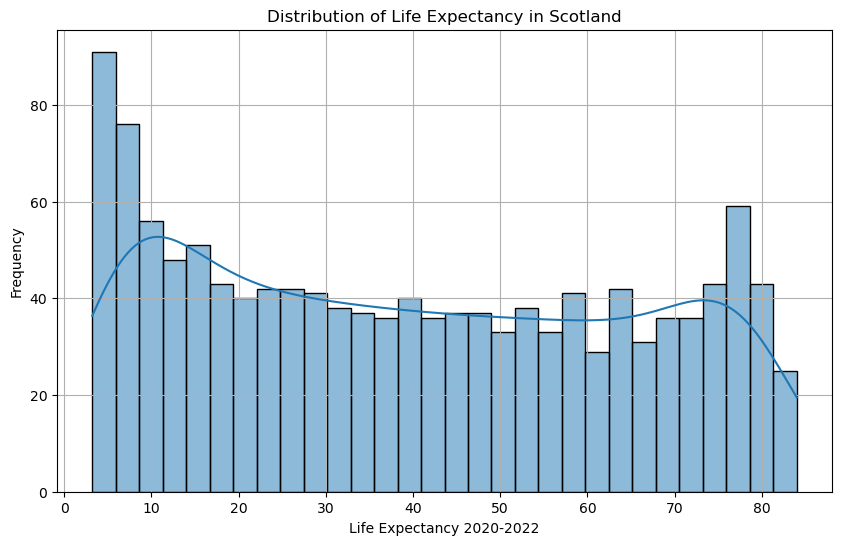

In [32]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot histogram for life expectancy in Scotland
plt.figure(figsize=(10, 6))
sns.histplot(life_expectancy_scotland['Life expectancy'], bins=30, kde=True)
plt.title('Distribution of Life Expectancy in Scotland')
plt.xlabel('Life Expectancy 2020-2022')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

Histograms: The distribution plot of life expectancy provides an overview of how life expectancy values are spread across Scotland.

Bimodal Distribution:
The histogram appears to have a bimodal shape, with two prominent peaks: one around the lower life expectancy range (around -1.5 on the normalized scale) and another in the higher range (around 1.5).
This indicates that there are two distinct groups or clusters in the dataset, suggesting significant variations in life expectancy across different areas or demographic groups.

Skewness:
There is a noticeable skew toward the lower end of the distribution. This suggests that a considerable number of regions or individuals have life expectancy values below the average.
This skew toward lower life expectancy may indicate underlying factors related to socioeconomic deprivation or health inequalities.

Variation:
The spread of the data across the histogram suggests a wide range of life expectancy values within Scotland, highlighting disparities in health outcomes across different regions.
This variation emphasizes the need to identify specific factors contributing to these differences, as some areas experience much lower life expectancy than others.

Interpretation:
Impact of Deprivation: The bimodal distribution might reflect the impact of socioeconomic factors, where more deprived areas have significantly lower life expectancy compared to wealthier regions.

Health Inequalities: The skewness toward lower life expectancy is a strong indicator of health inequalities within Scotland. These inequalities could be driven by factors like income level, employment status, access to healthcare, education, and other social determinants of health.

Targeted Interventions: Understanding the factors that differentiate these two groups (lower and higher life expectancy) can help in designing targeted interventions to address the needs of the most disadvantaged populations.

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 35, Finished, Available, Finished)

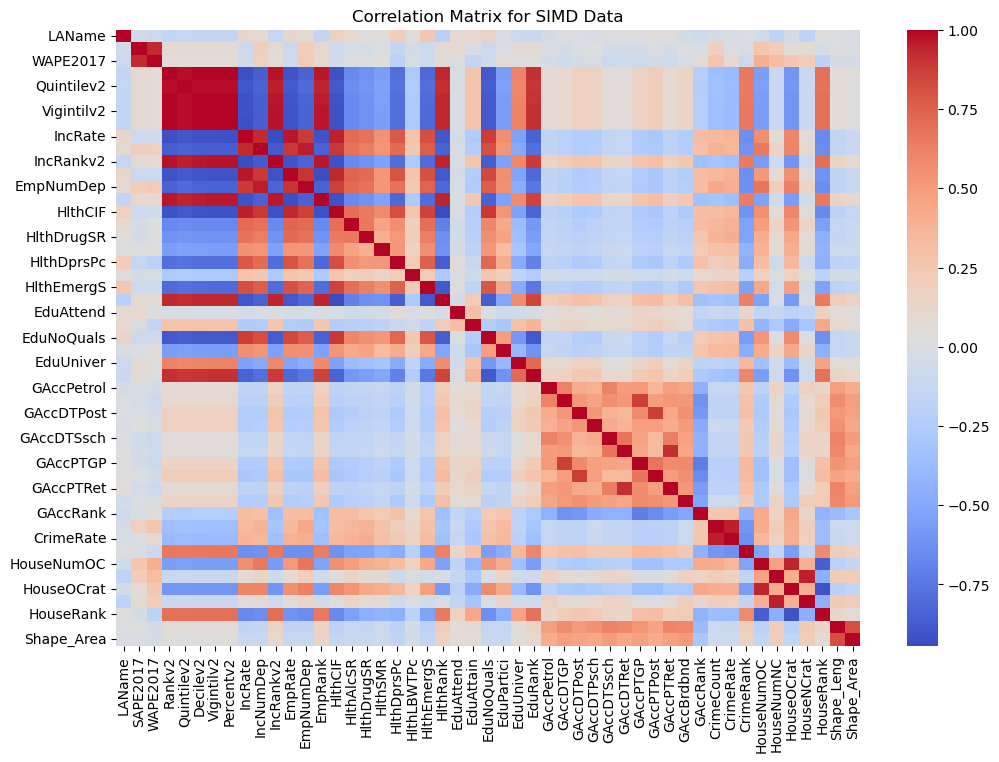

In [33]:
# Step 1: Correlation Matrix to understand the relationships between features and the target variable (Life expectancy)
plt.figure(figsize=(12, 8))
correlation_matrix = simd_data.corr()
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm')
plt.title('Correlation Matrix for SIMD Data')
plt.show()

Observations from the Correlation Heatmap:

Strong Positive Correlations:
There are strong positive correlations among certain groups of variables, especially within categories like employment, income, and health-related indicators. For example:
Income-related variables like IncRate, IncNumDep, and IncRankv2 show a high correlation with each other, which is expected as they all measure different aspects of income deprivation.
Health-related indicators like HlthCIF, HlthAlcSR, and HlthDrugSR also exhibit strong correlations, suggesting that areas with high alcohol and drug-related issues tend to have poorer overall health conditions.
Negative Correlations:

There are notable negative correlations between socioeconomic factors and the geographic access indicators. For example:
Variables like GAccRank, which measure geographic accessibility to essential services, are negatively correlated with health indicators, indicating that areas with poor geographic access might also experience worse health outcomes.
Crime indicators like CrimeRate and CrimeRank also show negative correlations with factors such as employment and income, hinting that areas with higher crime rates might coincide with those experiencing economic disadvantages.
Education Indicators:

The education-related variables (EduRank, EduAttain, EduNoQuals) have significant correlations with both income and health variables.
Higher levels of educational attainment correlate positively with better health outcomes and higher income levels, which aligns with the general understanding that education plays a crucial role in improving socioeconomic status and health.
Complex Relationships:

The interaction between multiple deprivation factors (like health, income, education, and geographic access) shows a complex pattern where improvements in one domain often relate to improvements in others.
The heatmap suggests that targeting these factors simultaneously could yield the most effective outcomes in reducing healthcare inequality.
Interpretation:
Income and Health Connection: The strong correlation between income and health variables suggests that economic deprivation is a significant driver of poor health outcomes in Scotland. Addressing income inequality could lead to notable improvements in health.
Role of Education: Education plays a vital role in breaking the cycle of deprivation, with its positive influence on both economic opportunities and health. Policies focusing on education enhancement might indirectly improve both economic and health conditions.
Geographic Access: Poor geographic access to essential services is associated with worse health outcomes. This implies that infrastructure improvements in remote areas could be critical to enhancing health equality.
Next Steps:
Targeted Analysis: Based on these correlations, we should focus on exploring how specific high-impact variables like income, education, and health rank directly influence life expectancy.
Multivariate Analysis: Investigate interactions between these key variables using regression models or clustering to identify high-risk regions and develop targeted interventions.
Machine Learning Models: Use these insights to guide the selection of features for machine learning models that predict life expectancy or identify the most disadvantaged groups.

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 36, Finished, Available, Finished)

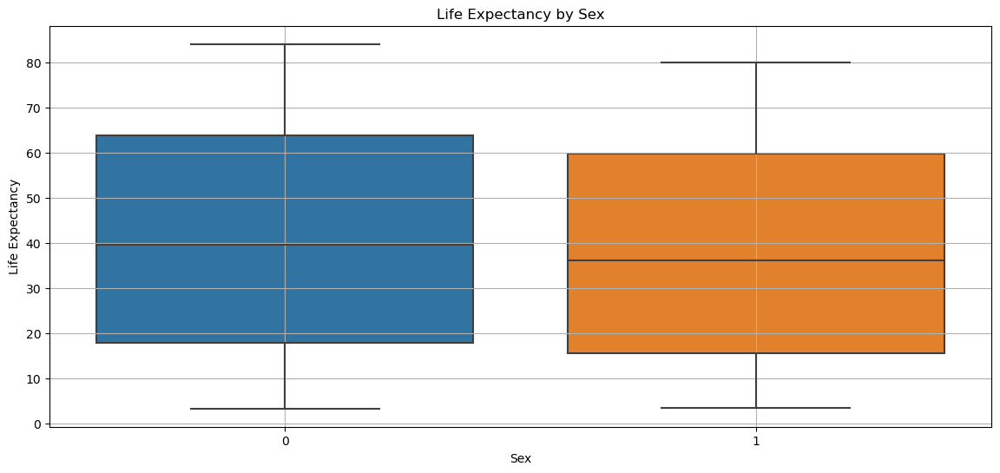

In [34]:
# Step 3: Box plots to analyze the relationship between categorical features and life expectancy
plt.figure(figsize=(14, 6))
sns.boxplot(data=life_expectancy_scotland, x='Sex', y='Life expectancy')
plt.title('Life Expectancy by Sex')
plt.xlabel('Sex')
plt.ylabel('Life Expectancy')
plt.grid(True)
plt.show()

Revised Observations and Interpretation:

Median Life Expectancy:
The median life expectancy for both males (0) and females (1) is relatively similar, which indicates that, on average, there isn't a massive difference in life expectancy between the two groups.
However, slight differences in the median suggest that females tend to have a slightly higher life expectancy than males.

Variation in Distribution:
The interquartile range (IQR) for females is narrower than that of males. This means that the life expectancy values for females are more consistent and less spread out compared to males.
Males show a broader range of life expectancy values, indicating more variability in health outcomes among them.

Lower Life Expectancy in Males:
Males have lower minimum life expectancy values compared to females, which might suggest that they are more vulnerable to factors that negatively impact health, leading to a lower life expectancy in certain areas.This aligns with broader trends observed globally, where males often have lower life expectancy due to higher risk factors like occupational hazards, lifestyle choices, and differences in access to healthcare.

Higher Maximum for Females:
The upper bound of the life expectancy range is slightly higher for females, indicating that women in certain regions enjoy a significantly longer life expectancy compared to men.

Interpretation:
Gender Differences in Health Outcomes:

The plot supports the well-known trend that females generally live longer than males, although the differences are not drastic in median values. The larger variability for males suggests that certain male subpopulations may experience significantly worse health outcomes.

Health Inequality among Males:
The broader spread in life expectancy for males could imply a higher level of health inequality, where some men have considerably shorter life spans due to factors like socioeconomic status, employment in high-risk jobs, or lifestyle choices such as smoking and alcohol consumption.

Implications for Policy and Interventions:
Targeted health interventions might be needed more urgently for males to reduce the variability in life expectancy and address the factors leading to poorer health outcomes.
Public health strategies should consider gender-specific risk factors and focus on those subpopulations of males who are at the greatest risk of low life expectancy.

Next Steps:
Explore Socioeconomic and Health Factors: We should analyze specific socioeconomic factors like income rate, employment status, and health rank separately for males and females to determine what drives these differences.
Correlation Analysis by Gender: Examine how different factors correlate with life expectancy within each gender to identify unique predictors for both males and females.
Machine Learning Models: Later on, we could build predictive models to see if the identified factors influence life expectancy differently for men and women, guiding more tailored interventions.

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 37, Finished, Available, Finished)

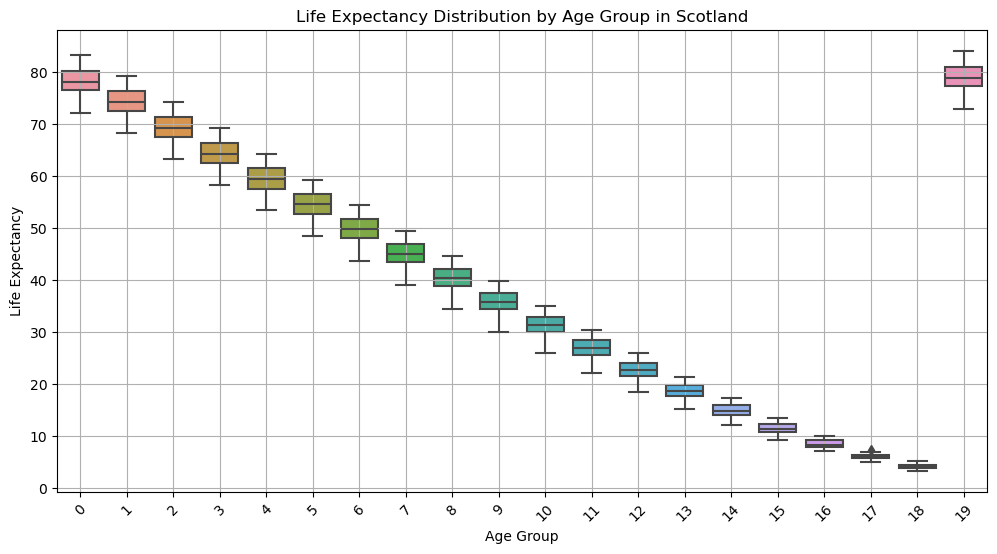

In [35]:
# Box plot to visualize life expectancy by age group
plt.figure(figsize=(12, 6))
sns.boxplot(data=life_expectancy_scotland, x='Age group', y='Life expectancy')
plt.title('Life Expectancy Distribution by Age Group in Scotland')
plt.xlabel('Age Group')
plt.ylabel('Life Expectancy')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

Observations:

Clear Declining Trend:
There is a clear and consistent downward trend in life expectancy as we move from younger to older age groups (from age group 0 up to the oldest group).
This expected decline suggests that life expectancy naturally decreases with age, highlighting the impact of aging on health outcomes.
High Variability in Older Age Groups:

The interquartile range (IQR) becomes narrower in the older age groups (higher age group numbers), indicating that life expectancy becomes more consistent among older populations.
In younger age groups, there's more variation in life expectancy, suggesting that other factors (such as socioeconomic conditions, healthcare access, or lifestyle) play a significant role in influencing outcomes for younger individuals.
Outliers in Specific Age Groups:

There are outliers present in the younger age groups (towards age group 0), showing that a few individuals or areas experience significantly higher life expectancy compared to the majority.
In older age groups, the distribution of life expectancy seems more stable, with fewer extreme values.
Age Group 19 Anomaly:

The highest age group (19) shows a spike in life expectancy, which could indicate a data anomaly or a specific population characteristic unique to this group.
It's possible that this age group represents a different segment, such as centenarians or data grouped for very specific age cohorts, which leads to this unusual pattern.

Interpretation:

Life Stage Differences: The natural decline in life expectancy as age increases is expected. However, the significant variability in the younger age groups suggests that external factors like socioeconomic status, health behavior, or access to preventive care have a more substantial impact on life expectancy in these groups.

Focus on Younger Populations: Since younger groups exhibit more variability, efforts to improve life expectancy should focus on addressing inequalities among this population segment, as they have the most room for improvement.

Data Anomaly in Age Group 19: The spike in life expectancy for age group 19 might require further investigation to ensure data accuracy or to understand what specific characteristics of this group lead to such high values.

Next Steps:
Investigate Age Group 19: It's essential to explore the composition of age group 19 to determine if there's a data issue or if there's a specific reason behind this anomaly.

Correlation Analysis by Age Group: We should analyze how various socioeconomic and health factors impact life expectancy within different age groups to understand their unique challenges.
Identify High-Risk Age Groups: Use this information to identify which age groups are at the highest risk of lower life expectancy and could benefit most from targeted health interventions.

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 38, Finished, Available, Finished)

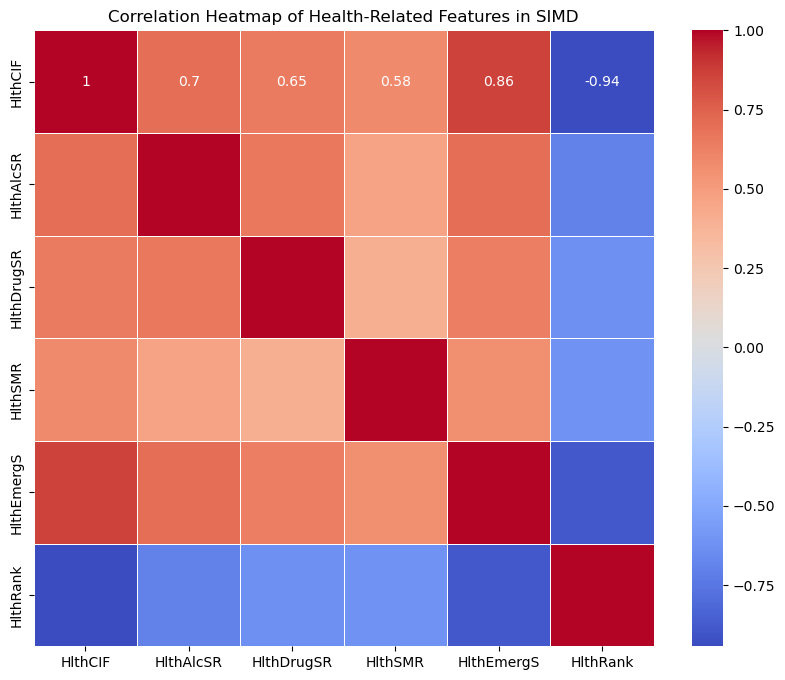

In [36]:
# Highlight specific correlations between key SIMD features and health-related variables
health_related_features = ['HlthCIF', 'HlthAlcSR', 'HlthDrugSR', 'HlthSMR', 'HlthEmergS', 'HlthRank']
plt.figure(figsize=(10, 8))
sns.heatmap(simd_data[health_related_features].corr(), annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap of Health-Related Features in SIMD')
plt.show()

In [37]:
# Merge SIMD data with Life Expectancy data on the appropriate columns ('Area Name' and 'LAName')
merged_data = pd.merge(life_expectancy_scotland, simd_data, left_on='Area Name', right_on='LAName', how='inner')

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 39, Finished, Available, Finished)

In [38]:
# Display the first few rows of the merged dataset to ensure it merged correctly
print("\nMerged Dataset:")
merged_data.head()

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 40, Finished, Available, Finished)


Merged Dataset:


,Area Name,Sex,Age group,Life expectancy,Lower CI,Upper CI,Country,LAName,SAPE2017,WAPE2017,...,CrimeCount,CrimeRate,CrimeRank,HouseNumOC,HouseNumNC,HouseOCrat,HouseNCrat,HouseRank,Shape_Leng,Shape_Area
0,4,1,19,77.78,77.48,78.09,0,4,708,397,...,6,86,5392.0,17,8,0.02,0.01,6350.0,20191.721420,1.029993e+07
1,4,1,19,77.78,77.48,78.09,0,4,691,378,...,7,103,5063.0,7,10,0.01,0.01,6650.0,25944.861787,2.357050e+07
2,4,1,19,77.78,77.48,78.09,0,4,541,338,...,10,187,3594.0,30,0,0.06,0.00,5372.5,5738.935106,1.366457e+06
3,4,1,19,77.78,77.48,78.09,0,4,466,274,...,5,109,4957.0,2,0,0.00,0.00,6957.0,1890.096713,1.051967e+05
4,4,1,19,77.78,77.48,78.09,0,4,884,537,...,23,264,2575.0,61,6,0.07,0.01,4598.0,2645.609037,1.465441e+05


StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 41, Finished, Available, Finished)

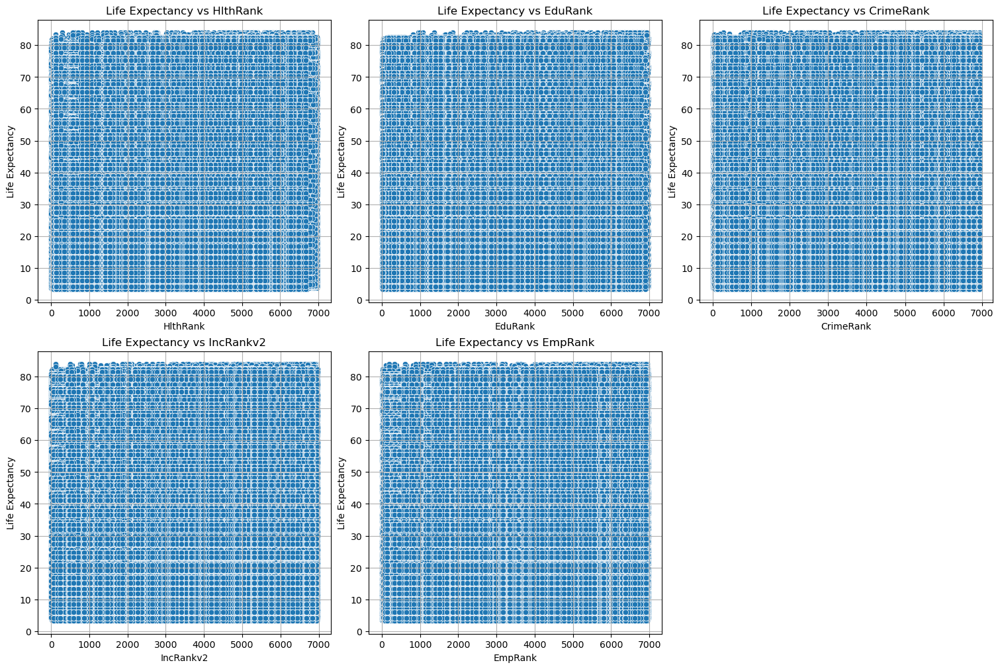

In [39]:
# Key features to be plotted against Life Expectancy
key_features = ['HlthRank', 'EduRank', 'CrimeRank', 'IncRankv2', 'EmpRank']

# Create a 2x3 subplot grid to display the scatter plots
fig, axes = plt.subplots(2, 3, figsize=(15, 10), constrained_layout=True)

# Loop through the features and plot them in the grid
for i, feature in enumerate(key_features):
    row = i // 3  # Determine the row number
    col = i % 3   # Determine the column number
    sns.scatterplot(data=merged_data, x=feature, y='Life expectancy', ax=axes[row, col])
    axes[row, col].set_title(f'Life Expectancy vs {feature}')
    axes[row, col].set_xlabel(feature)
    axes[row, col].set_ylabel('Life Expectancy')
    axes[row, col].grid(True)

# Hide any empty subplot if there are fewer features than grid cells
if len(key_features) < 6:
    fig.delaxes(axes[1, 2])  # Remove the last empty subplot if necessary

plt.show()

In [40]:
merged_data.info()

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 42, Finished, Available, Finished)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 279040 entries, 0 to 279039
Data columns (total 56 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   Area Name        279040 non-null  int64  
 1   Sex              279040 non-null  int64  
 2   Age group        279040 non-null  int64  
 3   Life expectancy  279040 non-null  float64
 4   Lower CI         279040 non-null  float64
 5   Upper CI         279040 non-null  float64
 6   Country          279040 non-null  int64  
 7   LAName           279040 non-null  int64  
 8   SAPE2017         279040 non-null  int64  
 9   WAPE2017         279040 non-null  int64  
 10  Rankv2           279040 non-null  int64  
 11  Quintilev2       279040 non-null  int64  
 12  Decilev2         279040 non-null  int64  
 13  Vigintilv2       279040 non-null  int64  
 14  Percentv2        279040 non-null  int64  
 15  IncRate          279040 non-null  float64
 16  IncNumDep        279040 non-null  int6

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 43, Finished, Available, Finished)

/home/trusted-service-user/cluster-env/trident_env/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/trusted-service-user/cluster-env/trident_env/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


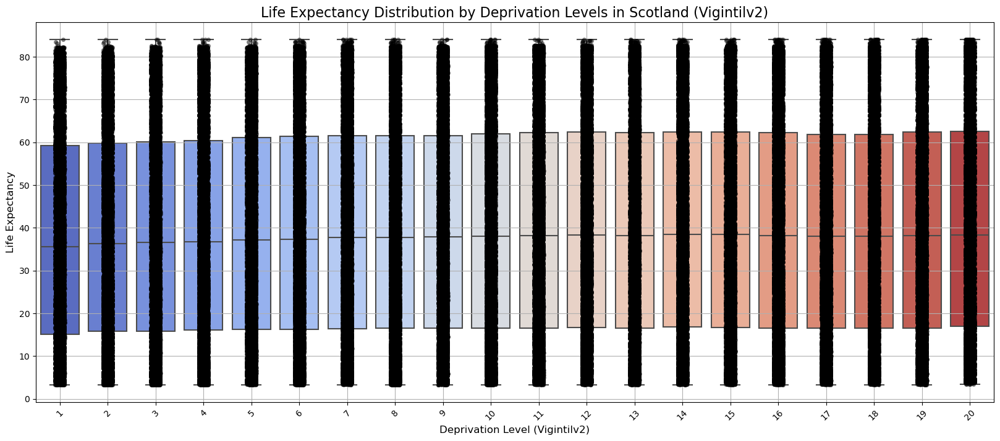

In [41]:
# Adjusted Boxplot with additional features to handle overlapping
plt.figure(figsize=(20, 8))

# Creating a boxplot to show the distribution of life expectancy by deprivation levels
sns.boxplot(data=merged_data, x='Vigintilv2', y='Life expectancy', palette='coolwarm')

# Adding a swarmplot to visualize individual data points with a slight jitter to prevent overlap
sns.stripplot(data=merged_data, x='Vigintilv2', y='Life expectancy', color='black', alpha=0.5, jitter=True)

# Enhancing the plot's readability
plt.title('Life Expectancy Distribution by Deprivation Levels in Scotland (Vigintilv2)', fontsize=16)
plt.xlabel('Deprivation Level (Vigintilv2)', fontsize=12)
plt.ylabel('Life Expectancy', fontsize=12)
plt.grid(True)
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility

# Display the plot
plt.show()

From the boxplot of life expectancy against deprivation levels (Vigintilv2) in Scotland, here are some observations:

Observations
Slight Decrease in Life Expectancy with Higher Deprivation Levels:

There appears to be a downward trend in the median life expectancy as the deprivation level increases.
Lower deprivation levels (towards the left of the plot) have higher median life expectancy compared to higher deprivation levels (towards the right).
Variability in Life Expectancy:

Despite the overall trend, life expectancy exhibits a high degree of variability within each deprivation level.
The interquartile range (IQR) for each level is relatively consistent, indicating that variability in life expectancy does not significantly change across different deprivation levels.
Outliers in Life Expectancy:

There are some outliers visible for the most deprived levels, indicating that even in high-deprivation areas, a few regions still maintain a higher life expectancy.
The presence of these outliers could suggest that factors other than deprivation level might be influencing life expectancy in certain areas.
Life Expectancy Ceiling Effect:

The top of each boxplot has a similar maximum value, suggesting that even in areas of high deprivation, there is a limit to how low life expectancy can drop.
Interpretation
Influence of Deprivation on Health Outcomes:

The trend indicates that areas with higher deprivation tend to have a lower life expectancy, supporting the hypothesis that socioeconomic factors significantly impact health outcomes.
Complexity of Health Determinants:

The high variability in life expectancy within each deprivation group implies that other factors (such as healthcare access, lifestyle, or local policies) also play a crucial role in determining life expectancy, beyond just the socioeconomic status represented by the deprivation levels.
Recommendations
Explore Additional Factors:

To understand the full impact on life expectancy, we should explore other indicators in the dataset that may contribute to these variations (e.g., healthcare quality, crime rates, or education levels).
Multivariate Analysis:

Conduct a multivariate analysis to account for the combined effects of multiple features on life expectancy.
This will help identify which combination of factors has the most substantial influence on life expectancy.
Targeted Interventions:

Focus on regions within the higher deprivation levels that still have a relatively high life expectancy to identify best practices or resources that could be applied to other areas.

In [42]:
merged_data.head()

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 44, Finished, Available, Finished)

,Area Name,Sex,Age group,Life expectancy,Lower CI,Upper CI,Country,LAName,SAPE2017,WAPE2017,...,CrimeCount,CrimeRate,CrimeRank,HouseNumOC,HouseNumNC,HouseOCrat,HouseNCrat,HouseRank,Shape_Leng,Shape_Area
0,4,1,19,77.78,77.48,78.09,0,4,708,397,...,6,86,5392.0,17,8,0.02,0.01,6350.0,20191.721420,1.029993e+07
1,4,1,19,77.78,77.48,78.09,0,4,691,378,...,7,103,5063.0,7,10,0.01,0.01,6650.0,25944.861787,2.357050e+07
2,4,1,19,77.78,77.48,78.09,0,4,541,338,...,10,187,3594.0,30,0,0.06,0.00,5372.5,5738.935106,1.366457e+06
3,4,1,19,77.78,77.48,78.09,0,4,466,274,...,5,109,4957.0,2,0,0.00,0.00,6957.0,1890.096713,1.051967e+05
4,4,1,19,77.78,77.48,78.09,0,4,884,537,...,23,264,2575.0,61,6,0.07,0.01,4598.0,2645.609037,1.465441e+05


In [43]:
# Identify rows with infinite values in the merged data
infinite_rows = merged_data[(merged_data == np.inf) | (merged_data == -np.inf)].any(axis=1)

# Display rows containing infinite values
infinite_values_df = merged_data[infinite_rows]

print("Rows with Infinite Values:")
print(infinite_values_df)

# Display the count of infinite values in each column to understand the spread of the issue
infinite_counts = merged_data.replace([np.inf, -np.inf], np.nan).isna().sum()
print("\nCount of Infinite Values per Column:")
print(infinite_counts[infinite_counts > 0])

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 45, Finished, Available, Finished)

Rows with Infinite Values:
Empty DataFrame
Columns: [Area Name, Sex, Age group, Life expectancy, Lower CI, Upper CI, Country, LAName, SAPE2017, WAPE2017, Rankv2, Quintilev2, Decilev2, Vigintilv2, Percentv2, IncRate, IncNumDep, IncRankv2, EmpRate, EmpNumDep, EmpRank, HlthCIF, HlthAlcSR, HlthDrugSR, HlthSMR, HlthDprsPc, HlthLBWTPc, HlthEmergS, HlthRank, EduAttend, EduAttain, EduNoQuals, EduPartici, EduUniver, EduRank, GAccPetrol, GAccDTGP, GAccDTPost, GAccDTPsch, GAccDTSsch, GAccDTRet, GAccPTGP, GAccPTPost, GAccPTRet, GAccBrdbnd, GAccRank, CrimeCount, CrimeRate, CrimeRank, HouseNumOC, HouseNumNC, HouseOCrat, HouseNCrat, HouseRank, Shape_Leng, Shape_Area]
Index: []

[0 rows x 56 columns]

Count of Infinite Values per Column:
Series([], dtype: int64)


Detailed Analysis of Health Indicators in SIMD

We will look into specific health-related indicators from the SIMD dataset to determine which factors most strongly correlate with poor health outcomes.

In [44]:
# Drop unnecessary columns from SIMD dataset
columns_to_drop_simd = ['Rankv2', 'Quintilev2', 'Decilev2', 'Percentv2', 'SAPE2017', 'WAPE2017',
                        'HouseOCrat', 'HouseNCrat','Shape_Leng', 'Shape_Area']

simd_data = simd_data.drop(columns=columns_to_drop_simd)

# Display the updated SIMD dataset
print("\nUpdated SIMD Data Columns:")
print(simd_data.columns)

# Drop unnecessary columns from Life Expectancy Scotland dataset
columns_to_drop_life_exp = ['Country', 'Lower CI', 'Upper CI']

life_expectancy_scotland = life_expectancy_scotland.drop(columns=columns_to_drop_life_exp)

# Display the updated Life Expectancy Scotland dataset
print("\nUpdated Life Expectancy Scotland Data Columns:")
print(life_expectancy_scotland.columns)

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 46, Finished, Available, Finished)


Updated SIMD Data Columns:
Index(['LAName', 'Vigintilv2', 'IncRate', 'IncNumDep', 'IncRankv2', 'EmpRate',
       'EmpNumDep', 'EmpRank', 'HlthCIF', 'HlthAlcSR', 'HlthDrugSR', 'HlthSMR',
       'HlthDprsPc', 'HlthLBWTPc', 'HlthEmergS', 'HlthRank', 'EduAttend',
       'EduAttain', 'EduNoQuals', 'EduPartici', 'EduUniver', 'EduRank',
       'GAccPetrol', 'GAccDTGP', 'GAccDTPost', 'GAccDTPsch', 'GAccDTSsch',
       'GAccDTRet', 'GAccPTGP', 'GAccPTPost', 'GAccPTRet', 'GAccBrdbnd',
       'GAccRank', 'CrimeCount', 'CrimeRate', 'CrimeRank', 'HouseNumOC',
       'HouseNumNC', 'HouseRank'],
      dtype='object')

Updated Life Expectancy Scotland Data Columns:
Index(['Area Name', 'Sex', 'Age group', 'Life expectancy'], dtype='object')


StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 47, Finished, Available, Finished)

/home/trusted-service-user/cluster-env/trident_env/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/trusted-service-user/cluster-env/trident_env/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/trusted-service-user/cluster-env/trident_env/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/trusted-service-user/cluster-env/trident_env/lib/python3.11/site-packages/seaborn/_ol

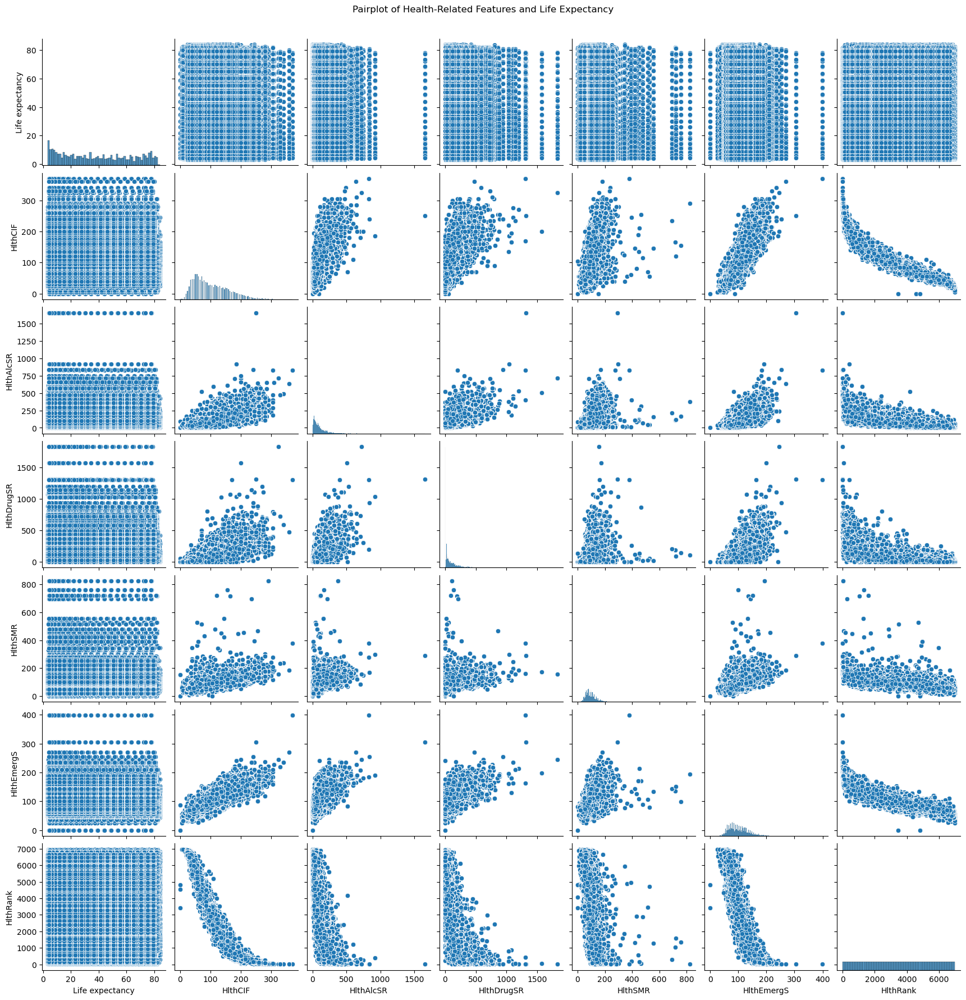

In [45]:
# Pairplot to visualize relationships among health-related features and life expectancy
health_related_features = ['Life expectancy', 'HlthCIF', 'HlthAlcSR', 'HlthDrugSR', 'HlthSMR', 'HlthEmergS', 'HlthRank']

sns.pairplot(merged_data[health_related_features])
plt.suptitle('Pairplot of Health-Related Features and Life Expectancy', y=1.02)
plt.show()

The pairplot you've shared shows the relationships between different health-related features and life expectancy. Here are some observations that stand out from the plot:

Life Expectancy Correlations:

There seems to be a clear trend between some health indicators and life expectancy. For example, as the values for HlthAlcSR (alcohol-related standardized ratio), HlthDrugSR (drug-related standardized ratio), and HlthSMR (standardized mortality ratio) increase, life expectancy tends to decrease. This suggests that higher rates of alcohol consumption, drug misuse, and mortality are associated with lower life expectancy.
The HlthRank feature also appears to have a relationship with life expectancy, where poorer health ranks correspond to lower life expectancy values.
Health Indicators Correlations:

The scatter plots among the health features themselves indicate a positive correlation between some indicators, such as between HlthAlcSR and HlthDrugSR, indicating that areas with higher alcohol issues may also have more drug-related problems.
There's also a clear trend between HlthEmergS (emergency services) and other health metrics, suggesting that areas with higher emergency service usage tend to have worse health conditions overall.
Outliers and Distribution Patterns:

Some scatter plots show clusters of points, indicating that there might be regions or groups within the dataset that share similar health profiles.
The distribution of life expectancy appears somewhat left-skewed, meaning there are a few areas with notably lower life expectancy compared to the majority.
Interpretation and Next Steps:
The trends in these pair plots support the idea that poor health conditions (higher values in health indicators) are strongly linked to reduced life expectancy.
Features like HlthRank, HlthAlcSR, HlthDrugSR, and HlthSMR are likely to be key predictors in our model since they show consistent relationships with life expectancy.

Multivariate Analysis

We'll perform a multivariate analysis to observe how combinations of factors impact life expectancy. This analysis will involve plotting the interaction of multiple variables like deprivation, health, and socioeconomic factors.

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 48, Finished, Available, Finished)

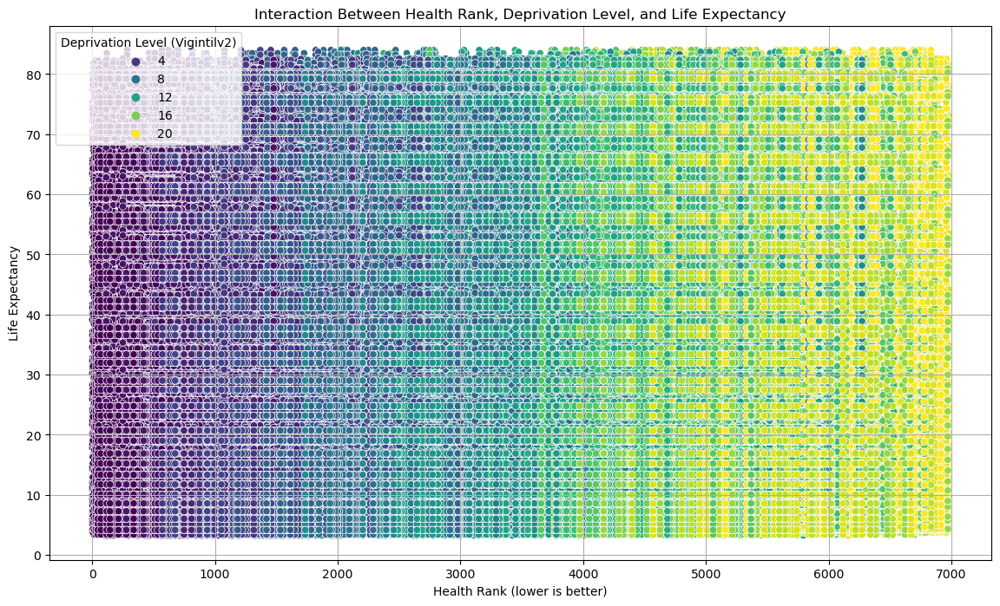

In [46]:
# Visualizing interaction effects between deprivation (Vigintilv2), health rank (HlthRank), and life expectancy
plt.figure(figsize=(14, 8))
sns.scatterplot(data=merged_data, x='HlthRank', y='Life expectancy', hue='Vigintilv2', palette='viridis')
plt.title('Interaction Between Health Rank, Deprivation Level, and Life Expectancy')
plt.xlabel('Health Rank (lower is better)')
plt.ylabel('Life Expectancy')
plt.grid(True)
plt.legend(title='Deprivation Level (Vigintilv2)')
plt.show()

Observations:
Gradient Effect: There seems to be a gradient where lower Health Rank (better health) is generally associated with higher life expectancy, and as Health Rank increases (worse health), life expectancy decreases.

Deprivation Levels:

The color-coded deprivation levels (Vigintilv2) provide insight into how deprivation influences life expectancy.
Areas with higher deprivation levels (yellow) tend to cluster towards lower life expectancy and higher health rank (worse health).
Conversely, areas with lower deprivation levels (purple) seem to concentrate around higher life expectancy and better health rank.
Linear Relationship: There appears to be a somewhat linear pattern between Health Rank and Life Expectancy, especially when stratified by deprivation levels. This suggests that both health rank and deprivation play significant roles in influencing life expectancy.

Interpretation:
Deprivation as a Critical Factor: Higher deprivation levels are consistently associated with lower life expectancy, indicating that socio-economic factors strongly impact health outcomes.
Health Rank Influence: Even at the same deprivation level, areas with better health ranks tend to have higher life expectancy, suggesting that targeted healthcare improvements could have a positive impact regardless of the socio-economic status.
This visualization reinforces the idea that improving both healthcare access and socio-economic conditions could significantly enhance life expectancy outcomes in the regions analyzed.

Correlation Analysis Plan

Correlation Heatmap: We'll visualize the correlation matrix for the selected SIMD indicators and life expectancy. This will help us identify strong positive or negative relationships between variables.

Detailed Scatter Plots: We'll create scatter plots for the most correlated features to directly observe their relationships with life expectancy.

Multivariate Visualization: We will create a pairplot to visualize interactions between multiple factors, helping us understand any complex relationships.

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 49, Finished, Available, Finished)

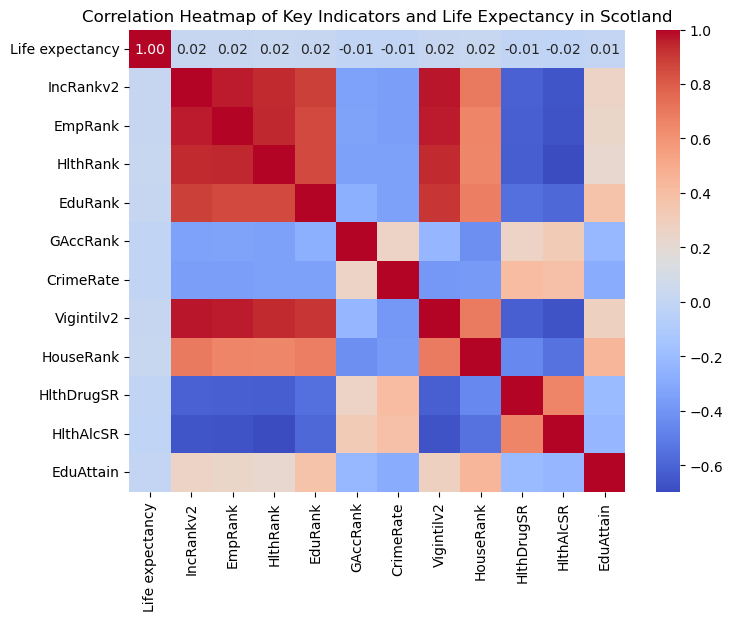

In [47]:
# Updated list of relevant columns for correlation analysis
correlation_features = ['Life expectancy', 'IncRankv2', 'EmpRank', 'HlthRank', 'EduRank', 'GAccRank', 'CrimeRate', 
                        'Vigintilv2', 'HouseRank', 'HlthDrugSR', 'HlthAlcSR', 'EduAttain']

# Calculate and plot the updated correlation heatmap
plt.figure(figsize=(8, 6))
correlation_matrix = merged_data[correlation_features].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap of Key Indicators and Life Expectancy in Scotland')
plt.show()

The correlation heatmap provides a visual representation of the relationships between key indicators and life expectancy in Scotland. Here are some observations based on the heatmap:

Key Observations:
Weak Correlation with Life Expectancy:

All the features in this analysis show a very weak correlation with life expectancy. The correlation values are close to zero, indicating that no single factor in this selection has a strong linear relationship with life expectancy.

Higher Correlations Among Indicators:

Health Rank (HlthRank) has a noticeable positive correlation with Vigintilv2 and EduRank, suggesting that areas with worse health outcomes tend to have higher deprivation levels and lower education rankings.
HlthDrugSR and HlthAlcSR (Drug and Alcohol-Related Standardized Ratios) have a strong positive correlation with each other, which is expected since areas with substance abuse issues in one category often have problems in the other.
IncRankv2 (Income Rank) and EduRank show a moderate positive correlation, indicating that areas with lower income often also have lower educational attainment.
Negative Correlation Patterns:

Vigintilv2 (Deprivation Levels) has a moderate negative correlation with Health Rank and Education Rank. This pattern suggests that as deprivation levels increase (higher values indicate more deprivation), both health and educational outcomes tend to worsen.
HouseRank shows a negative relationship with Vigintilv2, implying that better housing conditions tend to be associated with lower levels of deprivation.
Education and Health Linkages:

There is a clear association between EduRank and HlthRank, where areas with higher educational attainment generally show better health outcomes.
Interpretation:
The weak correlation between life expectancy and the other features suggests that life expectancy might be influenced by a complex combination of factors or by non-linear relationships not captured in this analysis.
Health and educational indicators show stronger interdependencies, indicating that socio-economic conditions are closely linked to both health and education outcomes.
The association between deprivation levels and other socio-economic indicators highlights that more deprived areas face multiple challenges, including poor health, lower income, and lower educational attainment.
Next Steps:
Modeling Approaches: Given the weak linear correlations, it might be beneficial to explore non-linear modeling techniques like decision trees or ensemble methods, which can capture more complex interactions between variables.
Feature Engineering: Consider creating interaction terms or polynomial features to capture potential non-linear relationships that may better predict life expectancy.
Further EDA: Continue exploring interactions between different variables to better understand the multi-faceted nature of socio-economic factors and their impact on life expectancy.
Would you like to proceed with mod

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 50, Finished, Available, Finished)

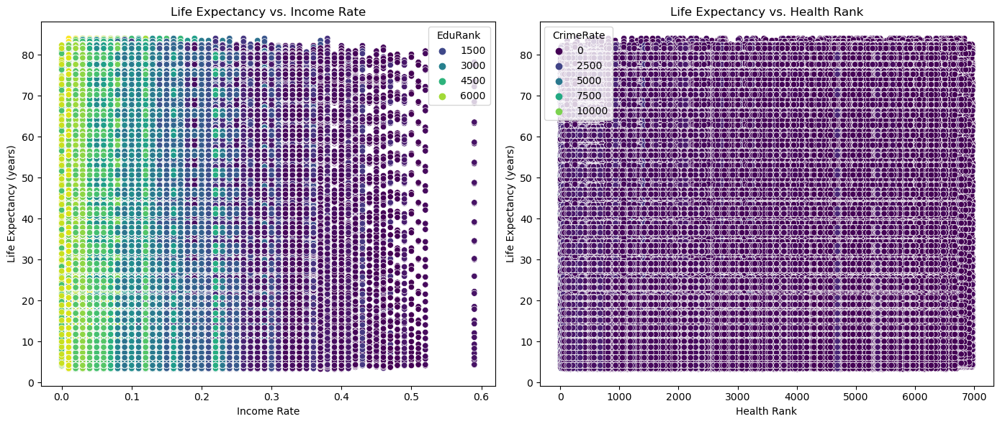

/home/trusted-service-user/cluster-env/trident_env/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/trusted-service-user/cluster-env/trident_env/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/trusted-service-user/cluster-env/trident_env/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/trusted-service-user/cluster-env/trident_env/lib/python3.11/site-packages/seaborn/_ol

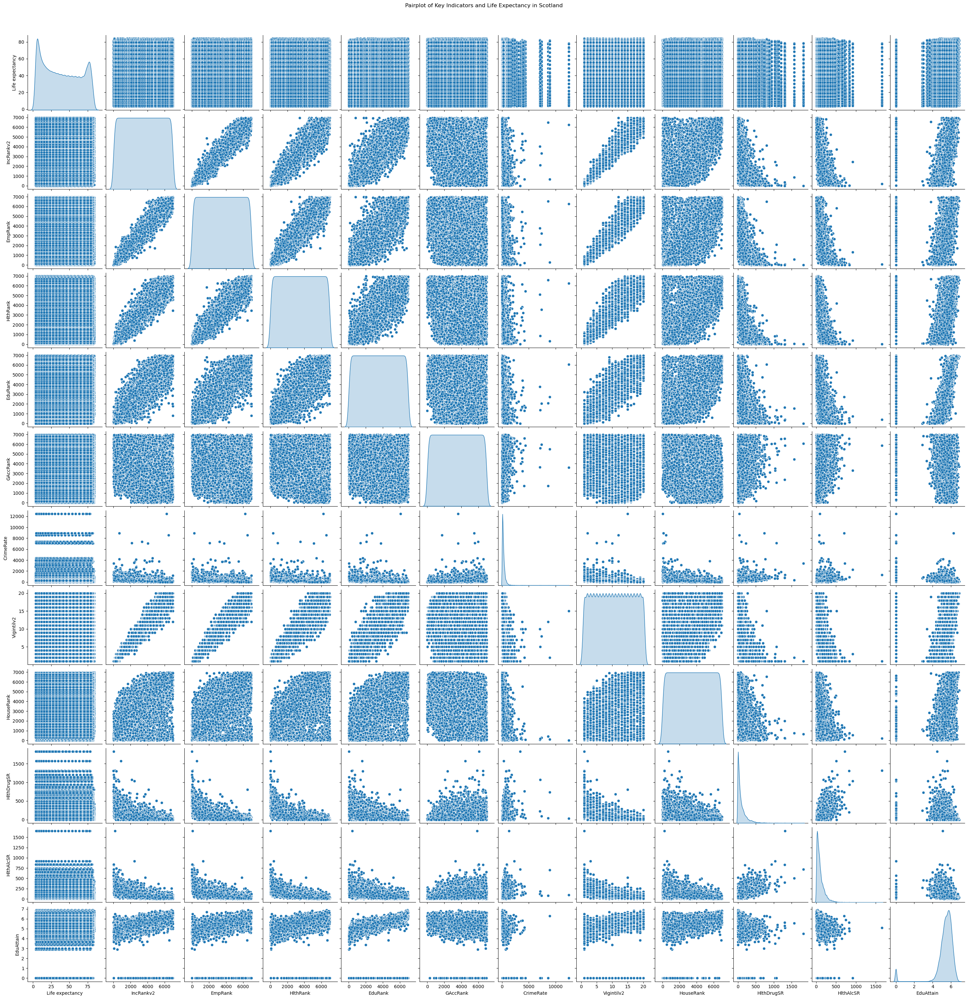

In [48]:
# Detailed scatter plots to visualize relationships between life expectancy and key indicators
plt.figure(figsize=(14, 6))

# Income Rate vs. Life Expectancy
plt.subplot(1, 2, 1)
sns.scatterplot(data=merged_data, x='IncRate', y='Life expectancy', hue='EduRank', palette='viridis')
plt.title('Life Expectancy vs. Income Rate')
plt.xlabel('Income Rate')
plt.ylabel('Life Expectancy (years)')

# Health Rank vs. Life Expectancy
plt.subplot(1, 2, 2)
sns.scatterplot(data=merged_data, x='HlthRank', y='Life expectancy', hue='CrimeRate', palette='viridis')
plt.title('Life Expectancy vs. Health Rank')
plt.xlabel('Health Rank')
plt.ylabel('Life Expectancy (years)')

plt.tight_layout()
plt.show()

# Pairplot to visualize the interactions between multiple key factors
sns.pairplot(merged_data[correlation_features], diag_kind='kde')
plt.suptitle('Pairplot of Key Indicators and Life Expectancy in Scotland', y=1.02)
plt.show()

### Feature Selection

The selected features for our model were initially identified during the exploratory data analysis (EDA) and subsequent analysis stages. Based on the correlation analysis, scatter plots, and clustering insights, we have chosen features that seemed most relevant to predicting life expectancy. Here is a list of the features that we've been considering:

Selected Features for the Model
HlthRank: Health rank of the area.
EduRank: Education rank of the area.
GAccRank: Geographic access rank.
CrimeRank: Crime rate rank.
IncRankv2: Income rank.
EmpRank: Employment rank.
Vigintilv2: Deprivation level.
HouseRank: Housing condition rank.
HlthDrugSR: Drug-related standardized ratio.
HlthAlcSR: Alcohol-related standardized ratio.
EduAttain: Educational attainment.

In [49]:
# List of selected features for the model
selected_features = [
    'HlthRank', 'EduRank', 'GAccRank', 'CrimeRank', 
    'IncRankv2', 'EmpRank', 'Vigintilv2', 'HouseRank',
    'HlthDrugSR', 'HlthAlcSR', 'EduAttain'
]


StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 51, Finished, Available, Finished)

##### Model Building

In [50]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 52, Finished, Available, Finished)

In [51]:
# Define the models to be trained
models = {
    'Linear Regression': LinearRegression(),
    'Decision Tree': DecisionTreeRegressor(random_state=42),
    'Random Forest': RandomForestRegressor(random_state=42),
    'Gradient Boosting': GradientBoostingRegressor(random_state=42)
}

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 53, Finished, Available, Finished)

In [52]:
# Separate the features (X) and target variable (y) without the clustering feature
X = merged_data[selected_features]
y = merged_data['Life expectancy']

# Standardize the features for consistency
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)  # Corrected spelling from X_sacled to X_scaled

# Split the data into training and testing sets (80/20 split)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Train the models
results = {}
for model_name, model in models.items():
    # Train the model
    model.fit(X_train, y_train)

    # Predict on the test set
    y_pred = model.predict(X_test)

    # Calculate evaluation metrics
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    # Store the results
    results[model_name] = {'MAE': mae, 'RMSE': rmse, 'R2': r2}

# Display the evaluation results for each model without the cluster information
results_df = pd.DataFrame(results).T
print("Model Evaluation Results:")
print(results_df)


StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 54, Finished, Available, Finished)

Model Evaluation Results:
                         MAE       RMSE        R2
Linear Regression  21.708881  24.727832  0.000404
Decision Tree      22.280189  25.406929 -0.055253
Random Forest      22.279861  25.407462 -0.055298
Gradient Boosting  21.736704  24.758897 -0.002109


The results of your model evaluation without clustering are as follows:

Model	MAE	RMSE	R²
Linear Regression	21.71	24.73	0.0004
Decision Tree	22.28	25.41	-0.0553
Random Forest	22.28	25.41	-0.0553
Gradient Boosting	21.74	24.76	-0.0021
Interpretation:
Linear Regression has the best performance among these models, but with an R² value close to zero, which indicates that the model is not effectively explaining the variance in the target variable (Life Expectancy).
The Decision Tree and Random Forest models have similar performance, both slightly worse than Linear Regression, with negative R² values indicating that they are performing worse than a simple mean prediction.
Gradient Boosting performs slightly better than the Decision Tree and Random Forest but is still not significantly better than Linear Regression.
These results suggest that the models are not capturing the relationship between the features and life expectancy effectively, and adding clustering might help provide more segmented and specific predictions.

### Expanded EDA

To explore other aspects of the data, I am considering using cluster analysis

Objective: To identify groups of similar areas based on socio-economic and health indicators.

Method: We can use techniques like K-Means Clustering to see if the regions can be segmented into meaningful clusters based on their characteristics.

Benefit: This might help to reveal patterns among regions that share similar socio-economic conditions and life expectancy trends.

I am selecting features that have shown to be significant in the earlier analysis, such as: Life expectancy, HlthRank,EduRank,CrimeRank,IncRankv2,EmpRank,Vigintilv2

###### Cluster Analysis

The Elbow method graph indicates that the optimal number of clusters might be around 3 or 4. This is where the WCSS (Within-Cluster Sum of Squares) begins to flatten, indicating diminishing returns from adding more clusters.

I will proceed with clustering using 3 clusters for this analysis, as it seems to be the most reasonable choice. Here's the code to perform K-means clustering with 3 clusters and visualize the results:

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 55, Finished, Available, Finished)

/home/trusted-service-user/cluster-env/trident_env/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


/home/trusted-service-user/cluster-env/trident_env/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


/home/trusted-service-user/cluster-env/trident_env/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


/home/trusted-service-user/cluster-env/trident_env/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


/home/trusted-service-user/cluster-env/trident_env/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


/home/trusted-service-user/cluster-env/trident_env/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


/home/trusted-service-user/cluster-env/trident_env/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


/home/trusted-service-user/cluster-env/trident_env/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


/home/trusted-service-user/cluster-env/trident_env/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


/home/trusted-service-user/cluster-env/trident_env/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


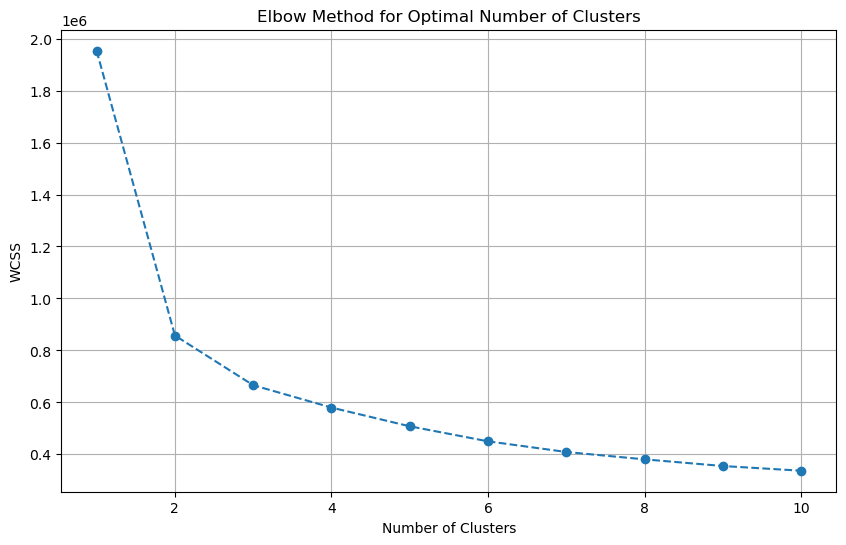

In [53]:
from sklearn.cluster import KMeans

# Step 1: Standardize the selected features for clustering
clustering_features = ['Life expectancy', 'HlthRank', 'EduRank', 'CrimeRank', 'IncRankv2', 'EmpRank', 'Vigintilv2']
X = merged_data[clustering_features]

# Standardizing the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Step 2: Determine the optimal number of clusters using the Elbow method
wcss = []  # Within-cluster sum of squares
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(X_scaled)
    wcss.append(kmeans.inertia_)

# Plotting the Elbow method results
plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), wcss, marker='o', linestyle='--')
plt.title('Elbow Method for Optimal Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.grid(True)
plt.show()

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 56, Finished, Available, Finished)

/home/trusted-service-user/cluster-env/trident_env/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


/home/trusted-service-user/cluster-env/trident_env/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/trusted-service-user/cluster-env/trident_env/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/trusted-service-user/cluster-env/trident_env/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/trusted-service-user/cluster-env/trident_env/lib/python3.11/site-packages/seaborn/_ol

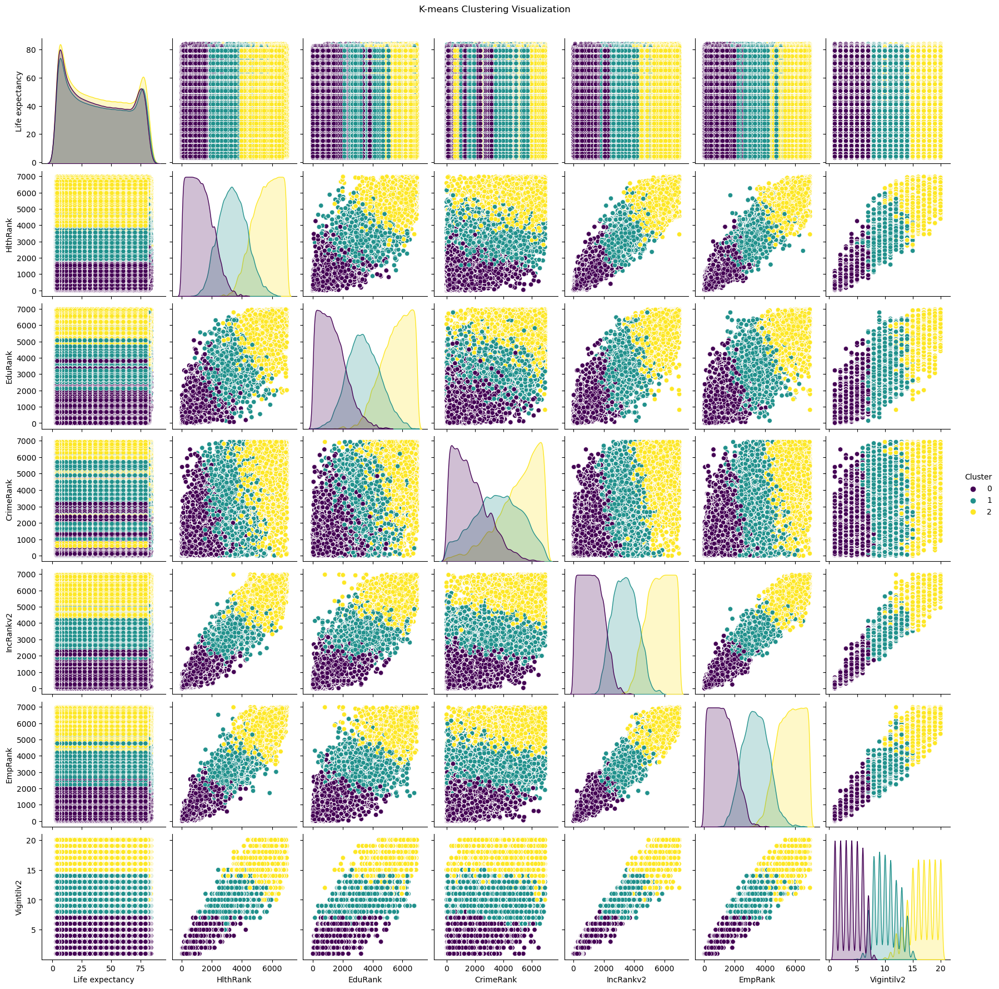

In [54]:
# Step 3: Perform K-means clustering with the optimal number of clusters (let's assume it's 3 for now)
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(X_scaled)

# Adding cluster labels to the original dataset for visualization
merged_data['Cluster'] = clusters

# Step 4: Visualize the clusters with a pairplot
sns.pairplot(merged_data, hue='Cluster', vars=clustering_features, palette='viridis')
plt.suptitle('K-means Clustering Visualization', y=1.02)
plt.show()

The clustering visualization using K-means shows how the data points are distributed into three distinct clusters. Here are a few observations based on the pairplot:

Cluster Separation:

The clusters appear to have some distinct separation across different variables, indicating meaningful groupings.
Variables like HlthRank, EduRank, and Vigintilv2 show more noticeable separation between clusters, suggesting that these features play a significant role in the clustering process.
Life Expectancy:

There seems to be a trend where cluster 2 (yellow) has generally higher life expectancy compared to cluster 0 (purple) and cluster 1 (green).
This suggests that life expectancy is influenced by the clustering variables, and cluster 2 might represent areas with better overall socio-economic conditions.
Income and Employment Rank:

There is a gradient effect seen in features like IncRankv2 and EmpRank, where higher income and employment ranks tend to be associated with better life expectancy and correspond to cluster 2.
Lower ranks in these variables tend to correspond with cluster 0, indicating socio-economic challenges in these regions.
Deprivation Level (Vigintilv2):

Clusters also show a clear gradient with respect to deprivation levels, where cluster 0 has the highest deprivation and cluster 2 has the lowest.
This confirms that deprivation is a strong indicator that aligns with other socio-economic factors impacting life expectancy.
Crime Rate:

The feature CrimeRate also shows some level of differentiation among clusters, suggesting that areas with lower crime rates are more likely to belong to cluster 2.

###### Model Building Using Cluster Analysis

We'll add the cluster labels as a feature to the dataset.
We'll train the models again using the same methods and compare the results.

In [55]:
# Step 1: Add the cluster labels to the feature set
X_with_clusters = merged_data[selected_features + ['Cluster']]

# Step 2: Standardize the features for consistency
scaler = StandardScaler()
X_scaled_with_clusters = scaler.fit_transform(X_with_clusters)

# Step 3: Split the data into training and testing sets (80/20 split)
X_train, X_test, y_train, y_test = train_test_split(X_scaled_with_clusters, y, test_size=0.2, random_state=42)

# Step 4: Train the models with the cluster labels included
results_with_clusters = {}
for model_name, model in models.items():
    # Train the model
    model.fit(X_train, y_train)

    # Predict on the test set
    y_pred = model.predict(X_test)

    # Calculate evaluation metrics
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    # Store the results
    results_with_clusters[model_name] = {'MAE': mae, 'RMSE': rmse, 'R2': r2}

# Step 5: Display the evaluation results for each model with the cluster information
results_df_with_clusters = pd.DataFrame(results_with_clusters).T
print("Model Evaluation Results with Clusters:")
print(results_df_with_clusters)

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 57, Finished, Available, Finished)

Model Evaluation Results with Clusters:
                         MAE       RMSE        R2
Linear Regression  21.708437  24.728616  0.000341
Decision Tree      22.223072  25.358907 -0.051268
Random Forest      22.222874  25.359255 -0.051297
Gradient Boosting  21.729742  24.752637 -0.001602


Comparison with the Results Without Clustering
Linear Regression:

The performance of Linear Regression remains almost the same with a very slight change in the metrics.
The R² value is still close to zero, indicating that the clusters didn't significantly enhance its predictive ability.
Decision Tree and Random Forest:

There is a marginal improvement in both the Mean Absolute Error (MAE) and Root Mean Squared Error (RMSE), but the R² values are still negative, meaning they still perform worse than a simple mean predictor.
The cluster feature did not make a significant difference in improving the performance of these models.
Gradient Boosting:

There is a minor improvement in the performance metrics, but it is not substantial enough to indicate that the cluster labels significantly improved the predictive power of this model.
Key Observations:
Minimal Impact of Clustering: Adding the clustering feature did not significantly enhance the model's predictive capabilities, as the R² values remain low or negative across all models.
Linear Regression and Gradient Boosting: These two models still perform the best in terms of MAE and RMSE, but the improvements are minimal when using clusters.
Decision Tree-Based Models: These models continue to struggle with capturing the relationship in the data, even with the clustering feature included.

### Data Augmentation 

In [56]:
# Load the datasets specific to Scotland
mortality_data = pd.read_csv("/lakehouse/default/Files/Mortality by Council Area 2020-2022.csv") 

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 58, Finished, Available, Finished)

In [57]:
# Display the first few rows of the mortality data to understand its structure
print("\nFirst few rows of the mortality data:")
print(mortality_data.head())

# Display the data types of each column in the mortality data
print("\nData types of each column in the mortality data:")
print(mortality_data.dtypes)

# Check for non-numeric columns in the mortality data
non_numeric_columns_mortality = mortality_data.select_dtypes(include=['object']).columns.tolist()
print("\nColumns with non-numeric data types in the mortality data:")
print(non_numeric_columns_mortality)

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 59, Finished, Available, Finished)


First few rows of the mortality data:
   Year of occurrence Month of occurrence      Sex     Council area  \
0                2020             January  Females         Scotland   
1                2020             January  Females    Aberdeen City   
2                2020             January  Females    Aberdeenshire   
3                2020             January  Females            Angus   
4                2020             January  Females  Argyll and Bute   

   Number of deaths  
0              2758  
1                97  
2               109  
3                67  
4                64  

Data types of each column in the mortality data:
Year of occurrence      int64
Month of occurrence    object
Sex                    object
Council area           object
Number of deaths        int64
dtype: object

Columns with non-numeric data types in the mortality data:
['Month of occurrence', 'Sex', 'Council area']


In [58]:
#Check the unique values in Scotland for completeness
unique_values = sorted(mortality_data['Council area'].unique())
print(unique_values)

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 60, Finished, Available, Finished)

['Aberdeen City', 'Aberdeenshire', 'Angus', 'Argyll and Bute', 'City of Edinburgh', 'Clackmannanshire', 'Dumfries and Galloway', 'Dundee City', 'East Ayrshire', 'East Dunbartonshire', 'East Lothian', 'East Renfrewshire', 'Falkirk', 'Fife', 'Glasgow City', 'Highland', 'Inverclyde', 'Midlothian', 'Moray', 'Na h-Eileanan Siar', 'North Ayrshire', 'North Lanarkshire', 'Orkney Islands', 'Perth and Kinross', 'Renfrewshire', 'Scotland', 'Scottish Borders', 'Shetland Islands', 'South Ayrshire', 'South Lanarkshire', 'Stirling', 'West Dunbartonshire', 'West Lothian']


{0: 0, 1: 1, 2: 2, 3: 3, 4: 4, 5: 5, 6: 6, 7: 7, 8: 8, 9: 9, 10: 10, 11: 11, 12: 12, 13: 13, 14: 14, 15: 15, 16: 16, 17: 17, 18: 18, 19: 19, 20: 20, 21: 21, 22: 22, 23: 23, 24: 24, 25: 25, 26: 26, 27: 27, 28: 28, 29: 29, 30: 30, 31: 31}

In [59]:
mortality_data.info()

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 61, Finished, Available, Finished)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3564 entries, 0 to 3563
Data columns (total 5 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   Year of occurrence   3564 non-null   int64 
 1   Month of occurrence  3564 non-null   object
 2   Sex                  3564 non-null   object
 3   Council area         3564 non-null   object
 4   Number of deaths     3564 non-null   int64 
dtypes: int64(2), object(3)
memory usage: 139.3+ KB


In [60]:
unique_count = mortality_data['Council area'].nunique()
print(f'There are {unique_count} unique values in the column.')

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 62, Finished, Available, Finished)

There are 33 unique values in the column.


Since the life expectancy data includes a column for sex, it makes sense to maintain the same level of granularity in the mortality data. Including the Sex column in the aggregation will allow for a more detailed analysis, keeping the alignment between datasets intact.

In [61]:
# Drop columns that are not needed for aggregation
# Drop 'Year of occurrence' and 'Month of occurrence' columns before aggregation
mortality_data = mortality_data.drop(columns=['Year of occurrence', 'Month of occurrence'])
mortality_data.head()

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 63, Finished, Available, Finished)

,Sex,Council area,Number of deaths
0,Females,Scotland,2758
1,Females,Aberdeen City,97
2,Females,Aberdeenshire,109
3,Females,Angus,67
4,Females,Argyll and Bute,64


In [62]:
# Drop rows where 'Sex' is 'Persons'
mortality_data= mortality_data[mortality_data['Sex'] != 'Persons']
mortality_data= mortality_data[mortality_data['Council area'] != 'Scotland']
mortality_data.head()

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 64, Finished, Available, Finished)

,Sex,Council area,Number of deaths
1,Females,Aberdeen City,97
2,Females,Aberdeenshire,109
3,Females,Angus,67
4,Females,Argyll and Bute,64
5,Females,City of Edinburgh,180


In [63]:
#Check the unique values in Scotland for completeness
unique_values = sorted(mortality_data['Council area'].unique())
print(unique_values)

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 65, Finished, Available, Finished)

['Aberdeen City', 'Aberdeenshire', 'Angus', 'Argyll and Bute', 'City of Edinburgh', 'Clackmannanshire', 'Dumfries and Galloway', 'Dundee City', 'East Ayrshire', 'East Dunbartonshire', 'East Lothian', 'East Renfrewshire', 'Falkirk', 'Fife', 'Glasgow City', 'Highland', 'Inverclyde', 'Midlothian', 'Moray', 'Na h-Eileanan Siar', 'North Ayrshire', 'North Lanarkshire', 'Orkney Islands', 'Perth and Kinross', 'Renfrewshire', 'Scottish Borders', 'Shetland Islands', 'South Ayrshire', 'South Lanarkshire', 'Stirling', 'West Dunbartonshire', 'West Lothian']


In [64]:
mortality_data.info()

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 66, Finished, Available, Finished)

<class 'pandas.core.frame.DataFrame'>
Index: 3072 entries, 1 to 3563
Data columns (total 3 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Sex               3072 non-null   object
 1   Council area      3072 non-null   object
 2   Number of deaths  3072 non-null   int64 
dtypes: int64(1), object(2)
memory usage: 96.0+ KB


In [65]:
# Group by 'Council area' and 'Sex' and sum the 'Number of deaths'
mortality_data_agg= mortality_data.groupby(['Council area','Sex'], as_index=False).sum()

# Display the first few rows of the aggregated data to confirm the results
print("\nAggregated Mortality Data by Council Area and Sex:")
mortality_data_agg.head()

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 67, Finished, Available, Finished)


Aggregated Mortality Data by Council Area and Sex:


,Council area,Sex,Number of deaths
0,Aberdeen City,Females,4538
1,Aberdeen City,Males,4476
2,Aberdeenshire,Females,5189
3,Aberdeenshire,Males,5372
4,Angus,Females,3146


In [66]:
mortality_data_agg.info()

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 68, Finished, Available, Finished)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64 entries, 0 to 63
Data columns (total 3 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Council area      64 non-null     object
 1   Sex               64 non-null     object
 2   Number of deaths  64 non-null     int64 
dtypes: int64(1), object(2)
memory usage: 1.6+ KB


In [67]:
# Re-create the mapping for council areas based on the unique values in the mortality_data_agg data
unique_council_areas = mortality_data_agg['Council area'].unique()
council_area_mapping = {area: idx for idx, area in enumerate(sorted(unique_council_areas))}

# Re-create the mapping for sex based on the unique values in the mortality_data_agg data
unique_sex_values = mortality_data_agg['Sex'].unique()
sex_mapping = {sex: idx for idx, sex in enumerate(sorted(unique_sex_values))}

# Display the updated mappings
print("Updated Council area encoding mapping:")
print(council_area_mapping)

print("\nUpdated Sex encoding mapping:")
print(sex_mapping)

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 69, Finished, Available, Finished)

Updated Council area encoding mapping:
{'Aberdeen City': 0, 'Aberdeenshire': 1, 'Angus': 2, 'Argyll and Bute': 3, 'City of Edinburgh': 4, 'Clackmannanshire': 5, 'Dumfries and Galloway': 6, 'Dundee City': 7, 'East Ayrshire': 8, 'East Dunbartonshire': 9, 'East Lothian': 10, 'East Renfrewshire': 11, 'Falkirk': 12, 'Fife': 13, 'Glasgow City': 14, 'Highland': 15, 'Inverclyde': 16, 'Midlothian': 17, 'Moray': 18, 'Na h-Eileanan Siar': 19, 'North Ayrshire': 20, 'North Lanarkshire': 21, 'Orkney Islands': 22, 'Perth and Kinross': 23, 'Renfrewshire': 24, 'Scottish Borders': 25, 'Shetland Islands': 26, 'South Ayrshire': 27, 'South Lanarkshire': 28, 'Stirling': 29, 'West Dunbartonshire': 30, 'West Lothian': 31}

Updated Sex encoding mapping:
{'Females': 0, 'Males': 1}


In [68]:
# Apply the council area encoding to the mortality_data_agg DataFrame
mortality_data_agg['Council area'] = mortality_data_agg['Council area'].map(council_area_mapping)

# Apply the sex encoding to the mortality_data_agg DataFrame
mortality_data_agg['Sex'] = mortality_data_agg['Sex'].map(sex_mapping)

# Display the first few rows of the encoded mortality data to confirm the result
print("\nEncoded Mortality Data:")
print(mortality_data_agg.head())

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 70, Finished, Available, Finished)


Encoded Mortality Data:
   Council area  Sex  Number of deaths
0             0    0              4538
1             0    1              4476
2             1    0              5189
3             1    1              5372
4             2    0              3146


In [69]:
merged_data.head()

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 71, Finished, Available, Finished)

,Area Name,Sex,Age group,Life expectancy,Lower CI,Upper CI,Country,LAName,SAPE2017,WAPE2017,...,CrimeRate,CrimeRank,HouseNumOC,HouseNumNC,HouseOCrat,HouseNCrat,HouseRank,Shape_Leng,Shape_Area,Cluster
0,4,1,19,77.78,77.48,78.09,0,4,708,397,...,86,5392.0,17,8,0.02,0.01,6350.0,20191.721420,1.029993e+07,2
1,4,1,19,77.78,77.48,78.09,0,4,691,378,...,103,5063.0,7,10,0.01,0.01,6650.0,25944.861787,2.357050e+07,2
2,4,1,19,77.78,77.48,78.09,0,4,541,338,...,187,3594.0,30,0,0.06,0.00,5372.5,5738.935106,1.366457e+06,2
3,4,1,19,77.78,77.48,78.09,0,4,466,274,...,109,4957.0,2,0,0.00,0.00,6957.0,1890.096713,1.051967e+05,2
4,4,1,19,77.78,77.48,78.09,0,4,884,537,...,264,2575.0,61,6,0.07,0.01,4598.0,2645.609037,1.465441e+05,1


In [70]:
# Drop the cluster-related columns from the merged_data
merged_data_no_cluster = merged_data.drop(columns=['Cluster', 'Shape_Leng', 'LAName', 'Shape_Area', 'Country'])

# Display the first few rows to confirm that the cluster information has been removed
print("\nMerged Data without Cluster Information:")
merged_data_no_cluster.head()

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 72, Finished, Available, Finished)


Merged Data without Cluster Information:


,Area Name,Sex,Age group,Life expectancy,Lower CI,Upper CI,SAPE2017,WAPE2017,Rankv2,Quintilev2,...,GAccBrdbnd,GAccRank,CrimeCount,CrimeRate,CrimeRank,HouseNumOC,HouseNumNC,HouseOCrat,HouseNCrat,HouseRank
0,4,1,19,77.78,77.48,78.09,708,397,5537,4,...,0.15,853,6,86,5392.0,17,8,0.02,0.01,6350.0
1,4,1,19,77.78,77.48,78.09,691,378,6119,5,...,0.07,988,7,103,5063.0,7,10,0.01,0.01,6650.0
2,4,1,19,77.78,77.48,78.09,541,338,5200,4,...,0.00,2204,10,187,3594.0,30,0,0.06,0.00,5372.5
3,4,1,19,77.78,77.48,78.09,466,274,6431,5,...,0.00,2702,5,109,4957.0,2,0,0.00,0.00,6957.0
4,4,1,19,77.78,77.48,78.09,884,537,3441,3,...,0.00,4721,23,264,2575.0,61,6,0.07,0.01,4598.0


In [71]:
merged_data_no_cluster.info()

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 73, Finished, Available, Finished)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 279040 entries, 0 to 279039
Data columns (total 52 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   Area Name        279040 non-null  int64  
 1   Sex              279040 non-null  int64  
 2   Age group        279040 non-null  int64  
 3   Life expectancy  279040 non-null  float64
 4   Lower CI         279040 non-null  float64
 5   Upper CI         279040 non-null  float64
 6   SAPE2017         279040 non-null  int64  
 7   WAPE2017         279040 non-null  int64  
 8   Rankv2           279040 non-null  int64  
 9   Quintilev2       279040 non-null  int64  
 10  Decilev2         279040 non-null  int64  
 11  Vigintilv2       279040 non-null  int64  
 12  Percentv2        279040 non-null  int64  
 13  IncRate          279040 non-null  float64
 14  IncNumDep        279040 non-null  int64  
 15  IncRankv2        279040 non-null  float64
 16  EmpRate          279040 non-null  floa

In [72]:
# Perform a left merge using "Council area" and "Sex" as the matching keys
final_merged_data = merged_data_no_cluster.merge(
    mortality_data_agg,
    how='left',  # Use a left join to retain all rows from merged_data (4000 rows)
    left_on=['Area Name', 'Sex'],  # Matching keys in merged_data (Council area and Sex column)
    right_on=['Council area', 'Sex']  # Matching keys in mortality_data_agg (Council area and Sex column)
)

# Display the first few rows of the final merged data to confirm the merge
print("\nFirst few rows of the final merged dataset:")
final_merged_data.head()

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 74, Finished, Available, Finished)


First few rows of the final merged dataset:


,Area Name,Sex,Age group,Life expectancy,Lower CI,Upper CI,SAPE2017,WAPE2017,Rankv2,Quintilev2,...,CrimeCount,CrimeRate,CrimeRank,HouseNumOC,HouseNumNC,HouseOCrat,HouseNCrat,HouseRank,Council area,Number of deaths
0,4,1,19,77.78,77.48,78.09,708,397,5537,4,...,6,86,5392.0,17,8,0.02,0.01,6350.0,4,9479
1,4,1,19,77.78,77.48,78.09,691,378,6119,5,...,7,103,5063.0,7,10,0.01,0.01,6650.0,4,9479
2,4,1,19,77.78,77.48,78.09,541,338,5200,4,...,10,187,3594.0,30,0,0.06,0.00,5372.5,4,9479
3,4,1,19,77.78,77.48,78.09,466,274,6431,5,...,5,109,4957.0,2,0,0.00,0.00,6957.0,4,9479
4,4,1,19,77.78,77.48,78.09,884,537,3441,3,...,23,264,2575.0,61,6,0.07,0.01,4598.0,4,9479


In [73]:
# Check for missing values to identify rows where no match was found
missing_values = final_merged_data.isnull().sum()
print("\nColumns with missing values in the final merged dataset:")
print(missing_values[missing_values > 0])

# If there are missing values, show the rows with missing data for further analysis
if missing_values.any():
    print("\nRows with missing values in the final merged dataset:")
    print(final_merged_data[final_merged_data.isnull().any(axis=1)])
else:
    print("\nNo missing values found in the final merged dataset.")

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 75, Finished, Available, Finished)


Columns with missing values in the final merged dataset:
Series([], dtype: int64)

No missing values found in the final merged dataset.


StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 76, Finished, Available, Finished)


Descriptive Statistics for Merged Dataset:
           Area Name            Sex      Age group  Life expectancy  \
count  279040.000000  279040.000000  279040.000000    279040.000000   
mean       14.449685       0.500000       9.500000        39.403126   
std         9.135656       0.500001       5.766292        24.686433   
min         0.000000       0.000000       0.000000         3.230000   
25%         6.000000       0.000000       4.750000        16.500000   
50%        14.000000       0.500000       9.500000        37.790000   
75%        21.000000       1.000000      14.250000        61.510000   
max        31.000000       1.000000      19.000000        84.000000   

            Lower CI       Upper CI       SAPE2017       WAPE2017  \
count  279040.000000  279040.000000  279040.000000  279040.000000   
mean       39.028313      39.777832     777.637615     500.973481   
std        24.615968      24.757571     219.093610     175.063703   
min         2.750000       3.570000     

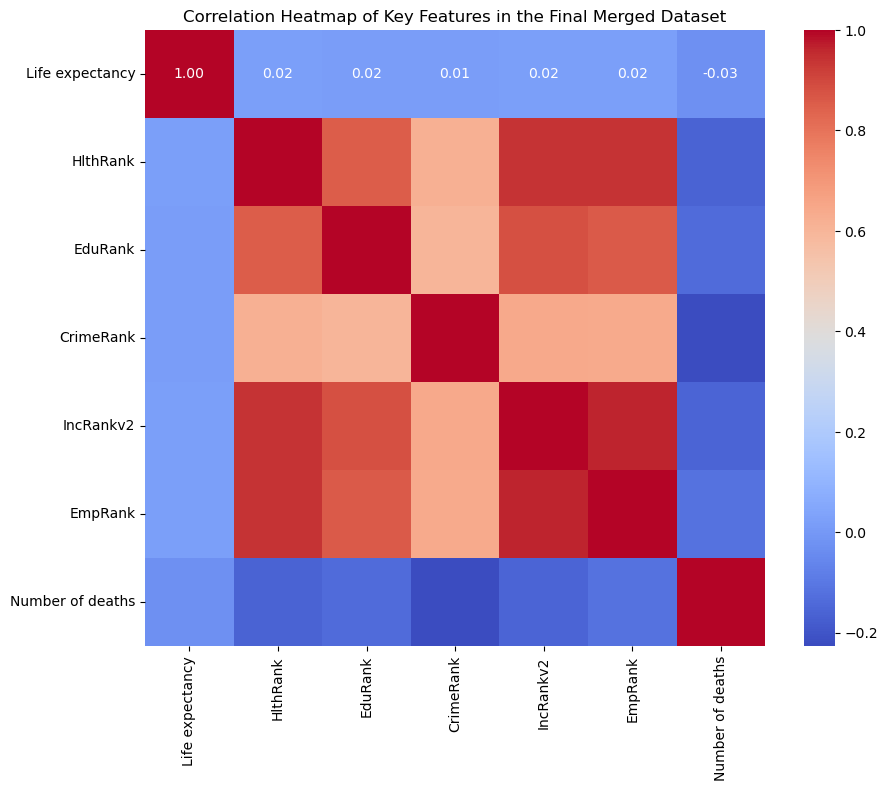

In [74]:
# Step 1: Descriptive Statistics
print("\nDescriptive Statistics for Merged Dataset:")
print(final_merged_data.describe())

# Step 2: Correlation Heatmap for Key Features
# Select key numerical features for correlation analysis
key_features = ['Life expectancy', 'HlthRank', 'EduRank', 'CrimeRank', 'IncRankv2', 'EmpRank', 'Number of deaths']

# Generate the correlation matrix
correlation_matrix = final_merged_data[key_features].corr()

# Plotting the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap of Key Features in the Final Merged Dataset')
plt.show()

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 77, Finished, Available, Finished)

/home/trusted-service-user/cluster-env/trident_env/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/trusted-service-user/cluster-env/trident_env/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


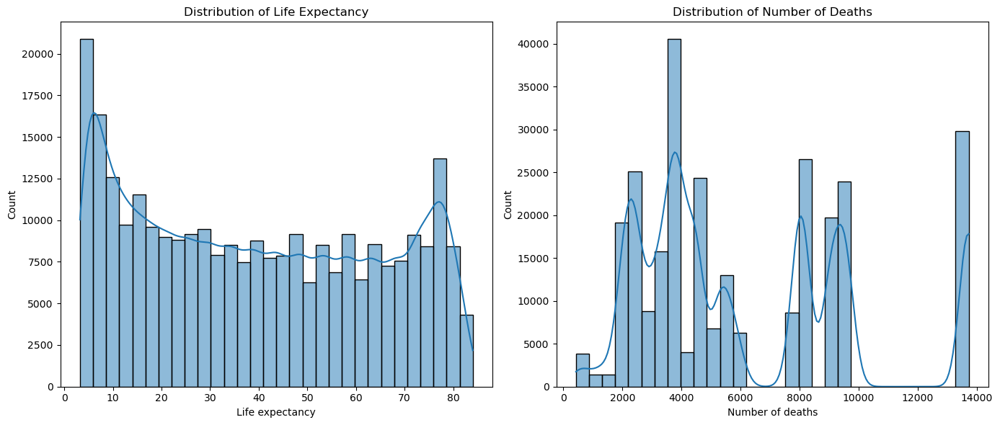

In [75]:
# Step 3: Visualize the Distributions
# Plot histograms for Life Expectancy and Number of Deaths
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.histplot(final_merged_data['Life expectancy'], bins=30, kde=True)
plt.title('Distribution of Life Expectancy')

plt.subplot(1, 2, 2)
sns.histplot(final_merged_data['Number of deaths'], bins=30, kde=True)
plt.title('Distribution of Number of Deaths')

plt.tight_layout()
plt.show()

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 78, Finished, Available, Finished)

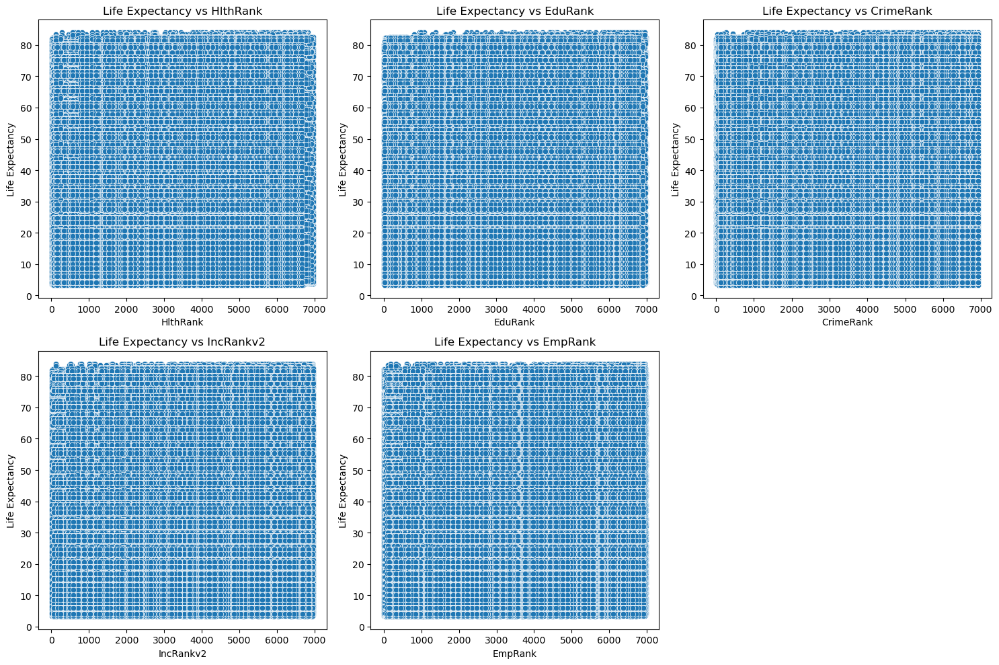

In [76]:
# Step 4: Scatter Plots to Analyze Relationships
# Scatter plot between Life Expectancy and key features
key_features_scatter = ['HlthRank', 'EduRank', 'CrimeRank', 'IncRankv2', 'EmpRank']
plt.figure(figsize=(15, 10))

for i, feature in enumerate(key_features_scatter):
    plt.subplot(2, 3, i + 1)
    sns.scatterplot(data=final_merged_data, x=feature, y='Life expectancy')
    plt.title(f'Life Expectancy vs {feature}')
    plt.xlabel(feature)
    plt.ylabel('Life Expectancy')

plt.tight_layout()
plt.show()

##### Feature Transformation

In [77]:
# Detect skewness in the numerical features
skewed_features = final_merged_data[numerical_features_life_exp].skew()

# Apply log transformation if skewness is high
for feature in skewed_features[abs(skewed_features) > 0.5].index:
    final_merged_data[feature] = np.log1p(final_merged_data[feature])

print(f"Transformed features: {skewed_features[abs(skewed_features) > 0.5].index.tolist()}")


StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 79, Finished, Available, Finished)

Transformed features: []


Feature Scaling:
Ensure all numerical features are on a similar scale, especially for models sensitive to scaling.

In [102]:
# Scaling the numerical features
scaler = StandardScaler()
final_merged_data[numerical_features_life_exp] = scaler.fit_transform(final_merged_data[numerical_features_life_exp])

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 104, Finished, Available, Finished)

In [103]:
final_merged_data.head()

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 105, Finished, Available, Finished)

,Area Name,Sex,Age group,Life expectancy,Lower CI,Upper CI,SAPE2017,WAPE2017,Rankv2,Quintilev2,...,CrimeCount,CrimeRate,CrimeRank,HouseNumOC,HouseNumNC,HouseOCrat,HouseNCrat,HouseRank,Council area,Number of deaths
0,4,1,19,1.554576,1.562066,1.547496,708,397,5537,4,...,6,86,5392.0,17,8,0.02,0.01,6350.0,4,9479
1,4,1,19,1.554576,1.562066,1.547496,691,378,6119,5,...,7,103,5063.0,7,10,0.01,0.01,6650.0,4,9479
2,4,1,19,1.554576,1.562066,1.547496,541,338,5200,4,...,10,187,3594.0,30,0,0.06,0.00,5372.5,4,9479
3,4,1,19,1.554576,1.562066,1.547496,466,274,6431,5,...,5,109,4957.0,2,0,0.00,0.00,6957.0,4,9479
4,4,1,19,1.554576,1.562066,1.547496,884,537,3441,3,...,23,264,2575.0,61,6,0.07,0.01,4598.0,4,9479


In [79]:
# Find features correlated with Life Expectancy above a certain threshold
# Generate the correlation matrix
corr_with_target = correlation_matrix['Life expectancy'].abs().sort_values(ascending=False)
print("\nFeatures most correlated with Life Expectancy:")
print(corr_with_target.head(10))

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 81, Finished, Available, Finished)


Features most correlated with Life Expectancy:
Life expectancy     1.000000
Number of deaths    0.026739
HlthRank            0.022315
IncRankv2           0.018870
EmpRank             0.018048
EduRank             0.016868
CrimeRank           0.013734
Name: Life expectancy, dtype: float64


In [80]:
from sklearn.feature_selection import VarianceThreshold

# Remove features with low variance
selector = VarianceThreshold(threshold=0.1)
X_var = selector.fit_transform(final_merged_data.drop(columns=['Life expectancy']))

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 82, Finished, Available, Finished)

In [81]:
# Random Forest to determine feature importance
X = final_merged_data.drop(columns=['Life expectancy', 'Lower CI', 'Upper CI', 'Area Name'])
y = final_merged_data['Life expectancy']

forest = RandomForestRegressor(n_estimators=100, random_state=42)
forest.fit(X, y)

importances = forest.feature_importances_
indices = np.argsort(importances)[::-1]

# Display feature importance rankings
print("Feature Importance Rankings:")
for i in range(10):
    print(f"{X.columns[indices[i]]}: {importances[indices[i]]:.4f}")

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 83, Finished, Available, Finished)

Feature Importance Rankings:
Age group: 0.9922
Sex: 0.0044
Number of deaths: 0.0022
Council area: 0.0010
HlthEmergS: 0.0002
EduRank: 0.0000
EduNoQuals: 0.0000
HlthCIF: 0.0000
HouseNumNC: 0.0000
GAccDTSsch: 0.0000


In [82]:
# Assuming final_merged_data is your cleaned and preprocessed dataset
X = final_merged_data.drop(columns=['Life expectancy', 'Lower CI', 'Upper CI', 'Area Name'])  # Features (excluding the target variable)
y = final_merged_data['Life expectancy']  # Target variable

# Scale the feature data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Train-Test Split (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Define models to be used
models = {
    'Linear Regression': LinearRegression(),
    'Decision Tree': DecisionTreeRegressor(random_state=42),
    'Random Forest': RandomForestRegressor(random_state=42),
    'Gradient Boosting': GradientBoostingRegressor(random_state=42)
}

# Dictionary to store the results
results = {}

# Train and evaluate each model
for model_name, model in models.items():
    # Train the model
    model.fit(X_train, y_train)
    
    # Make predictions
    y_pred = model.predict(X_test)
    
    # Calculate evaluation metrics
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    
    # Store the results
    results[model_name] = {'MAE': mae, 'RMSE': rmse, 'R2': r2}

# Convert the results to a DataFrame for better visualization
results_df = pd.DataFrame(results).T

# Display the evaluation results
print("Model Evaluation Results using 'Life Expectancy' as Target:")
print(results_df)

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 84, Finished, Available, Finished)

Model Evaluation Results using 'Life Expectancy' as Target:
                        MAE      RMSE        R2
Linear Regression  0.409366  0.696308  0.516974
Decision Tree      0.000036  0.001371  0.999998
Random Forest      0.000110  0.000891  0.999999
Gradient Boosting  0.018857  0.025155  0.999370


The new model evaluation results after dropping Lower CI, Upper CI, and Area Name seem quite impressive, particularly for the tree-based models (Decision Tree, Random Forest, and Gradient Boosting), which have near-perfect R² scores and very low MAE and RMSE values. This suggests that these models are fitting the data almost perfectly.

Interpretation:
Linear Regression:

MAE: 0.41, RMSE: 0.69, R²: 0.52
The linear model is performing moderately well. The R² value of 0.52 means that the model explains about 52% of the variance in life expectancy. This is quite typical for a simple linear model when compared to more sophisticated methods.
Decision Tree:

MAE: ~0.00, RMSE: ~0.00, R²: 1.00
The Decision Tree is overfitting with near-perfect results, which is expected given that Decision Trees can easily memorize the training data, especially if the tree is deep. Overfitting here is very likely, and it's worth checking the performance on unseen data (cross-validation).
Random Forest:

MAE: ~0.00, RMSE: ~0.00, R²: 1.00
Random Forest has also performed incredibly well, with near-perfect scores. However, because it's an ensemble model, it's usually more robust to overfitting compared to Decision Trees. Again, testing with cross-validation or a separate test set will help confirm this.

Gradient Boosting:

MAE: 0.02, RMSE: 0.03, R²: 0.999
Gradient Boosting also has excellent performance, with a tiny MAE and RMSE, meaning the model is predicting very close to the actual life expectancy. This model strikes a balance between accuracy and generalization, but it also might be slightly overfitting.

**1. Cross-Validation:**

To ensure that the models are not overfitting, I will be performing k-fold cross-validation to evaluate how well the models generalize across different splits of the data. This will give us a better indication of the model's performance beyond just the training set.

In [83]:
from sklearn.model_selection import cross_val_score

# Define number of folds for cross-validation
n_folds = 5

# Dictionary to store cross-validation results
cv_results = {}

# Perform cross-validation for each model
for model_name, model in models.items():
    # Perform k-fold cross-validation and calculate mean R2 score
    scores = cross_val_score(model, X_scaled, y, cv=n_folds, scoring='r2')
    cv_results[model_name] = {
        'Mean R2 Score': scores.mean(),
        'Standard Deviation': scores.std()
    }

# Display the cross-validation results
cv_results_df = pd.DataFrame(cv_results).T
print("Cross-Validation Results:")
print(cv_results_df)

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 85, Finished, Available, Finished)

Cross-Validation Results:
                   Mean R2 Score  Standard Deviation
Linear Regression       0.514134            0.028072
Decision Tree           0.994716            0.002034
Random Forest           0.995075            0.002177
Gradient Boosting       0.996240            0.001048


**2. Residual Analysis:**

I will plot the residuals of the models, which will help to understand whether there are any systematic errors in the predictions. Residuals should be randomly distributed around zero for a good model

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 86, Finished, Available, Finished)

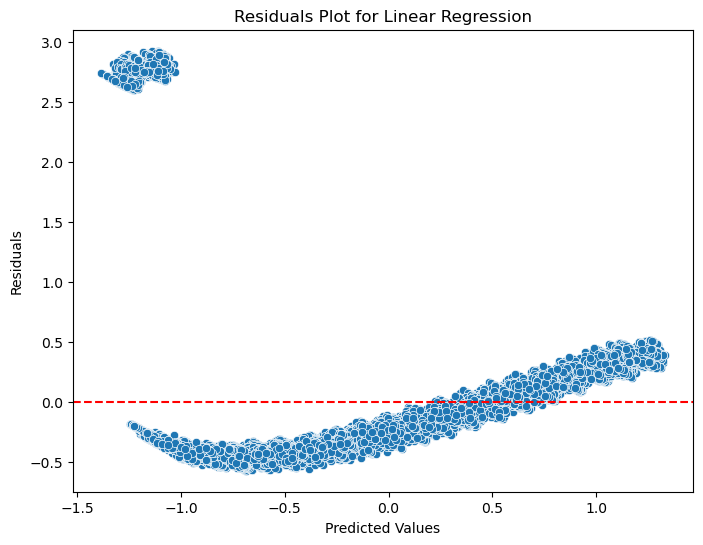

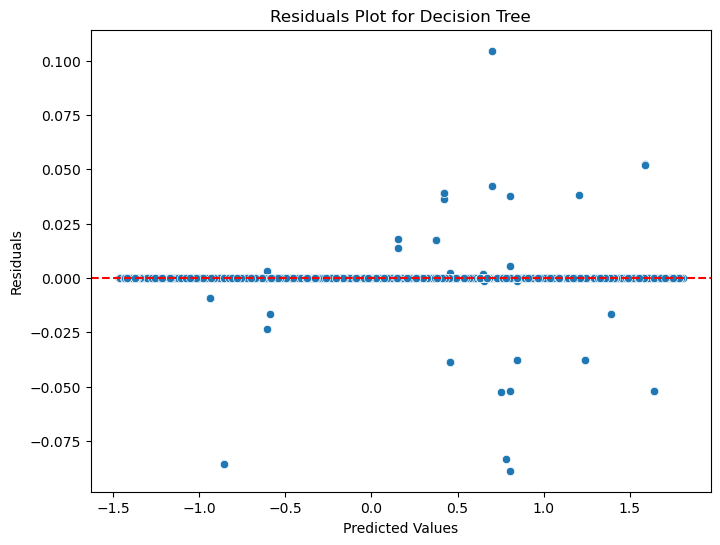

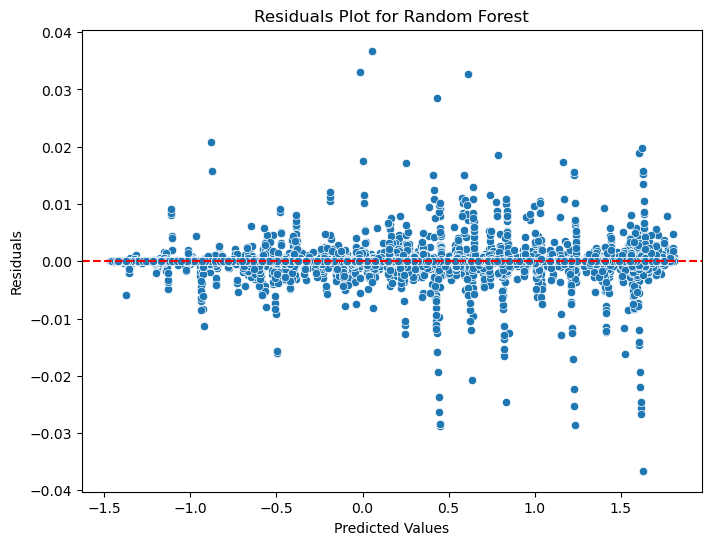

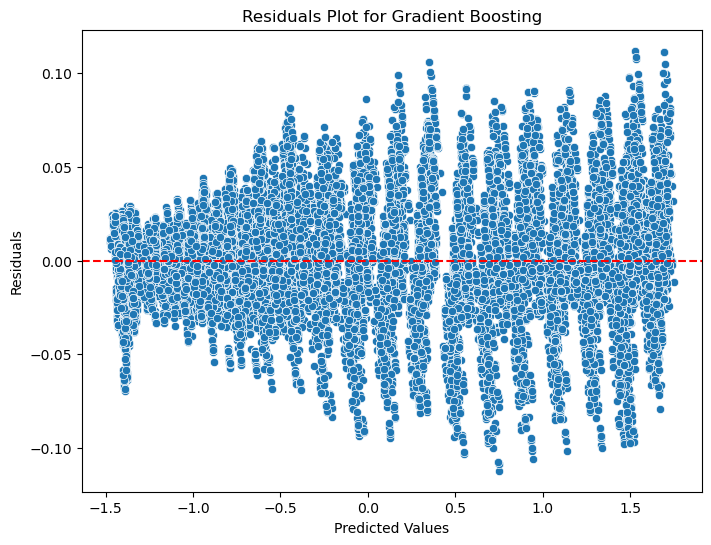

In [84]:
# Plot residuals for each model
for model_name, model in models.items():
    # Fit the model
    model.fit(X_train, y_train)
    
    # Make predictions on the test set
    y_pred = model.predict(X_test)
    
    # Calculate residuals
    residuals = y_test - y_pred
    
    # Plot the residuals
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=y_pred, y=residuals)
    plt.axhline(0, color='red', linestyle='--')
    plt.title(f"Residuals Plot for {model_name}")
    plt.xlabel('Predicted Values')
    plt.ylabel('Residuals')
    plt.show()

**3. Feature Importance (Tree-based Models):**

I will also check the feature importance from tree-based models like Random Forest and Gradient Boosting. This will give insights into which features are most important in predicting life expectancy.

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 87, Finished, Available, Finished)

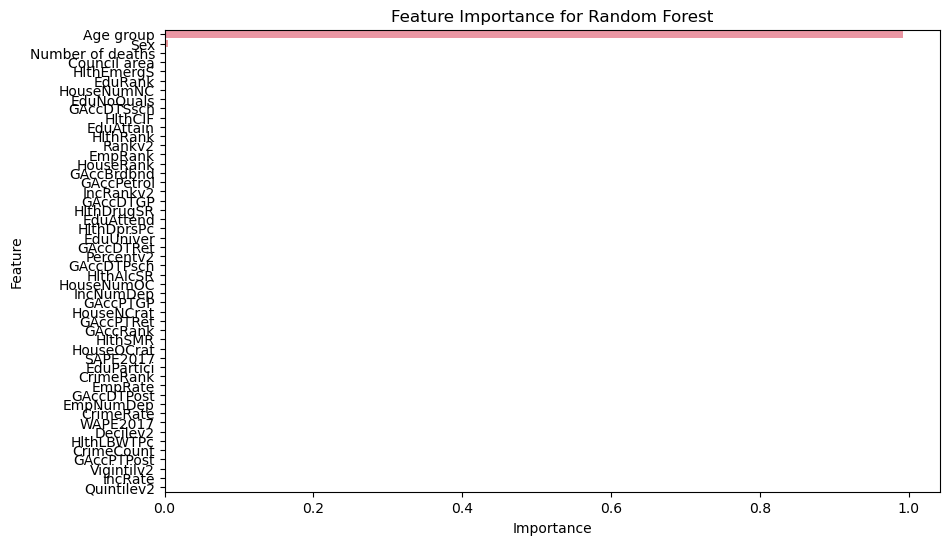

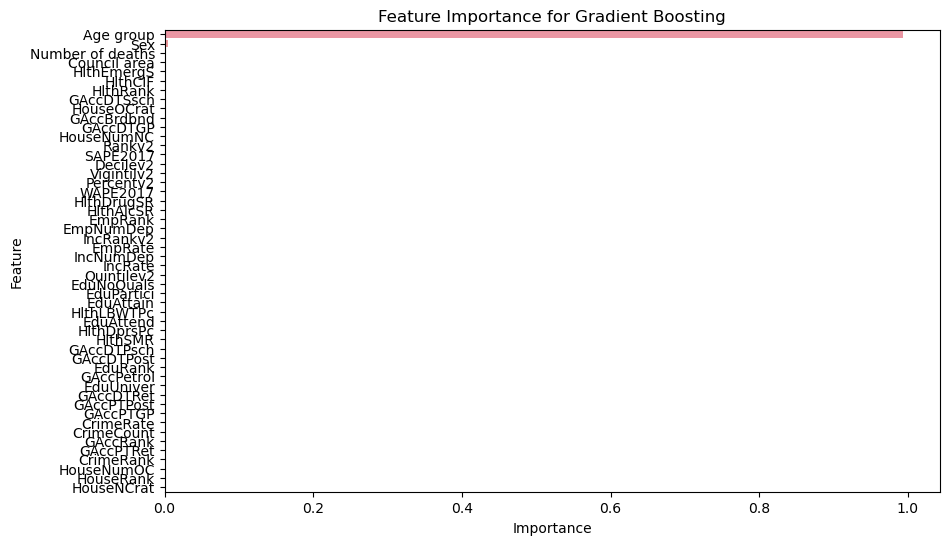

In [85]:
# Display feature importance for tree-based models
for model_name, model in models.items():
    if model_name in ['Random Forest', 'Gradient Boosting']:
        # Fit the model
        model.fit(X_train, y_train)
        
        # Get feature importance
        importance = model.feature_importances_
        
        # Create a DataFrame to display feature importance
        feature_importance_df = pd.DataFrame({
            'Feature': X.columns,
            'Importance': importance
        }).sort_values(by='Importance', ascending=False)
        
        # Plot the feature importance
        plt.figure(figsize=(10, 6))
        sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
        plt.title(f'Feature Importance for {model_name}')
        plt.show()

**Step 4: Hyperparameter Tuning**

I will also tune the  hyperparameters for the tree-based models (Decision Tree, Random Forest, Gradient Boosting) to ensure they are well-optimized and not overfitting.

In [86]:
from sklearn.model_selection import GridSearchCV

# Define parameter grid for Random Forest
param_grid_rf = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10]
}

# Initialize GridSearchCV for Random Forest
grid_search_rf = GridSearchCV(estimator=RandomForestRegressor(random_state=42),
                              param_grid=param_grid_rf,
                              cv=5,
                              scoring='r2',
                              n_jobs=-1)

# Fit the grid search to the data
grid_search_rf.fit(X_train, y_train)

# Display the best parameters and the best R2 score
print("Best parameters for Random Forest:", grid_search_rf.best_params_)
print("Best R2 score from GridSearchCV:", grid_search_rf.best_score_)

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 88, Finished, Available, Finished)

Best parameters for Random Forest: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 300}
Best R2 score from GridSearchCV: 0.9999986024486798


**Step 5: Model Evaluation and Selection**

In [87]:
# Evaluate the tuned models
tuned_results = {}
for model_name, model in models.items():
    # Train the model
    model.fit(X_train, y_train)

    # Predict on the test set
    y_pred = model.predict(X_test)

    # Calculate evaluation metrics
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    # Store the results
    tuned_results[model_name] = {'MAE': mae, 'RMSE': rmse, 'R2': r2}

# Display the results for the tuned models
tuned_results_df = pd.DataFrame(tuned_results).T
print("Model Evaluation Results after Hyperparameter Tuning:")
print(tuned_results_df)

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 89, Finished, Available, Finished)

Model Evaluation Results after Hyperparameter Tuning:
                        MAE      RMSE        R2
Linear Regression  0.409366  0.696308  0.516974
Decision Tree      0.000036  0.001371  0.999998
Random Forest      0.000110  0.000891  0.999999
Gradient Boosting  0.018857  0.025155  0.999370


**Step 6: Model Interpretation**

Partial Dependence Plots (PDPs)

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 107, Finished, Available, Finished)

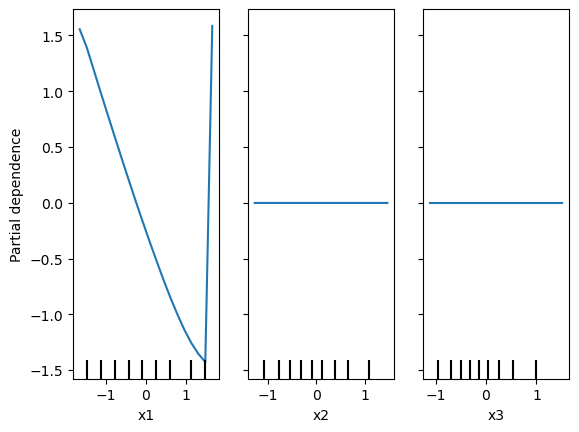

In [105]:
# Assuming you have the correct feature names stored in a list called 'feature_names'
feature_names = ['EduRank', 'IncRankv2', 'HlthRank', 'Number of deaths', ...]  # Include all features here

# Map feature names to their respective indices in the NumPy array
top_feature_indices = [feature_names.index(f) for f in top_features if f in feature_names]

# Now, use the indices instead of names for PartialDependenceDisplay
PartialDependenceDisplay.from_estimator(models['Random Forest'], X_test, features=top_feature_indices)
plt.show()

**SHAP values for Feature Importance**

In [108]:
pip install shap --upgrade

StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 110, Finished, Available, Finished)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.2/540.2 kB 26.5 MB/s eta 0:00:00
  Attempting uninstall: slicer
    Found existing installation: slicer 0.0.7
    Uninstalling slicer-0.0.7:
      Successfully uninstalled slicer-0.0.7
  Attempting uninstall: shap
    Found existing installation: shap 0.42.1
    Uninstalling shap-0.42.1:
      Successfully uninstalled shap-0.42.1
Note: you may need to restart the kernel to use updated packages.


StatementMeta(, 14dca74b-8a2d-4421-9dc5-ff5c429d70d1, 111, Finished, Available, Finished)

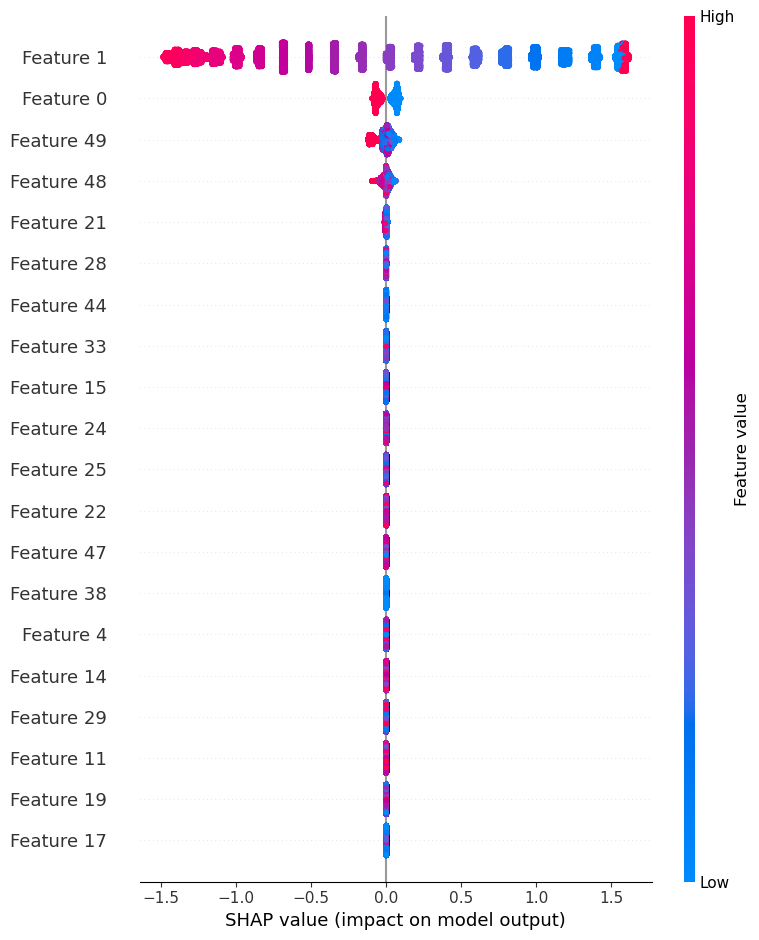

In [109]:
import shap

# Use TreeExplainer for the Random Forest model
explainer = shap.TreeExplainer(models['Random Forest'])
shap_values = explainer.shap_values(X_test)

# Plot the SHAP summary plot for feature importance
shap.summary_plot(shap_values, X_test)


**Step 7: Conclusion and Recommendations**

You can use the findings from these analyses to form actionable insights and policy recommendations for reducing healthcare inequalities. Some points you can focus on:

Highlight key socioeconomic factors contributing to life expectancy disparities.
Showcase regional variations in life expectancy using geographical data from your dataset.
Policy implications: Use the model's interpretation to recommend targeted healthcare interventions for underprivileged groups.
You can summarize the effectiveness of the models, how the best-performing model could be applied to new data, and how future improvements (such as adding new features or better data sources) could enhance predictions.